In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import pymc as pm
import arviz as az

from math import log10, floor

useratiodata=1 #1 for Scenario B to incorporate ratio data, 0 otherwise
sigmadeterministic=1 #0 to assign Inverse Gamma prior on variance of noise variables, otherwise plug in estimates will be used. 

In [2]:
dataflows = pd.read_csv("England_19_Obs_Flows_24.csv",comment='#')
datastocks = pd.read_csv("England_19_Obs_Stocks_June.csv",comment='#')

scale=1.0 #1000.0

#sigmastd=0.1 #0.01 #3.0

datastocks['quantity']=datastocks['quantity']/scale
dataflows['quantity']=dataflows['quantity']/scale

from preprocessingagg import preprocessing, createdesignmatrix, createratiomatrix, createcompactmatrix, createcompactratiomatrix
from prior import round_to_poweroften, definepriors
from model_Copy2 import mfamodel
from posteriorpredictive import filelabeler, ppplots, ppplotsratiodata, top10hdi

availabledatafull, dataparentstockneededcols, dataparentflowsneededcols, processnamesdict, allflownumbersmatrix, m, N, massconservedindices=preprocessing(datastocks,dataflows)

print('check mass conserved indices')
print(massconservedindices)

#construct the prior

dataflowspriors = pd.read_csv("England_19_Prior_Flows_24.csv",comment='#')
datastockspriors = pd.read_csv("England_19_Prior_Stocks_June.csv",comment='#')

#compact prior code from aluminium code
#priormean,covariancevec,truevalues=definepriors(datastockspriors, dataflowspriors, availabledatafull, m, N)

#non compact code

#priormean = np.array([dataavg] * N)
priormean = np.array([1000.0] * N)/scale
#covariancevec = (dataavg**2)  * np.ones(N)
covariancevec = 10000000.0  * np.ones(N)/scale**2 #100000.0  * np.ones(N)/scale

dataflowspriors['quantity']=dataflowspriors['quantity']/scale
datastockspriors['quantity']=datastockspriors['quantity']/scale


dataflowspriorchild=dataflowspriors.loc[(dataflowspriors['ParentProcessFlowfrom'] == 0) & (dataflowspriors['ParentProcessFlowto'] == 0)]
dataflowspriorfromparent=dataflowspriors.loc[(dataflowspriors['ParentProcessFlowfrom'] == 1) & (dataflowspriors['ParentProcessFlowto'] == 0)]
dataflowspriortoparent=dataflowspriors.loc[(dataflowspriors['ParentProcessFlowfrom'] == 0) & (dataflowspriors['ParentProcessFlowto'] == 1)]
dataflowspriorparent=dataflowspriors.loc[(dataflowspriors['ParentProcessFlowfrom'] == 1) & (dataflowspriors['ParentProcessFlowto'] == 1)]


datastockspriorsparent=datastockspriors.loc[datastockspriors['ParentProcess'] == 1]

datastockspriorschild=datastockspriors.loc[datastockspriors['ParentProcess'] == 0]


datastockspriorschild=datastockspriorschild[['Processnumber', 'quantity']]
print(datastockspriorschild)
datastockspriorschild=datastockspriorschild.to_numpy()
print(datastockspriorschild)

dataflowspriorchild = dataflowspriorchild[['Flownumberfrom', 'Flownumberto','quantity']]
dataflowspriorchild["Flownumber"] = m + (dataflowspriorchild["Flownumberfrom"]) * m + dataflowspriorchild["Flownumberto"]
print(dataflowspriorchild)
dataflowspriorchild = dataflowspriorchild[['Flownumber','quantity']].to_numpy()
print(dataflowspriorchild)

#priormean[0]=-37.2
#priormean[1]=9.8

datastockspriorsparent=datastockspriorsparent.to_numpy()
dataflowspriorfromparent=dataflowspriorfromparent.to_numpy()
dataflowspriortoparent=dataflowspriortoparent.to_numpy()
dataflowspriorparent=dataflowspriorparent.to_numpy()

print('datastockpriorsparent')
for row in datastockspriorsparent:
    print(row)
    subprocesses = row[7].split("-")
    subprocesses = list(map(int, subprocesses))
    subprocesses.sort()
    print(subprocesses)
    print(row[1]/len(subprocesses))
    for i in subprocesses:
        priormean[i] = max(row[1] / (scale*len(subprocesses)),100.0/scale) #max(row[1] / (scale*len(subprocesses)),0.0/scale)
        covariancevec[i] = 10*np.copy(priormean[i])**2 #max(0.75*row[1] / (scale*len(subprocesses)),1000.0/scale) #min(0.75*row[1],500)  / len(subprocesses)
        #covariancevec[i] = 0.1

print('dataflowspriortoparent')
for row in dataflowspriortoparent:
    print(row)
    print(row[2])
    print(row[5])
    print(row[10])

    subprocesses = row[10].split("-")
    subprocesses = list(map(int, subprocesses))
    subprocesses.sort()
    print(subprocesses)
    print(row[2]/len(subprocesses))
    for subprocess in subprocesses:
        priormean[m + (row[5]) * m + subprocess]=max(row[2]/(scale*len(subprocesses)),100.0/scale) #max(row[2]/(scale*len(subprocesses)),0.0/scale)
        covariancevec[m + (row[5]) * m + subprocess] = 10*np.copy(priormean[m + (row[5]) * m + subprocess])**2 #max(row[1] / (scale*len(subprocesses)),100.0**2) #100.0 #max(0.75*row[2]/(scale*len(subprocesses)),1000.0/scale)  #min(0.75*row[2],500)/len(subprocesses)
        #covariancevec[m + (row[5]) * m + subprocess] = 0.1
        

print('dataflowspriorfromparent')
for row in dataflowspriorfromparent:
    print(row)
    print(row[2])
    print(row[6])
    print(row[9])

    subprocesses = row[9].split("-")
    subprocesses = list(map(int, subprocesses))
    subprocesses.sort()
    print(subprocesses)
    print(row[2] / len(subprocesses))
    for subprocess in subprocesses:
        print(f"priormean size: {priormean.shape}")
        print(f"Length of subprocesses: {len(subprocesses)}")
        priormean[m + (subprocess) * m + row[6]] = max(row[2] / (scale*len(subprocesses)),100.0/scale)
        covariancevec[m + (subprocess) * m + row[6]] = 10*np.copy(priormean[m + (subprocess) * m + row[6]])**2 #100.0 #max(0.75*row[2]/(scale*len(subprocesses)),1000.0/scale)

print('dataflowspriorparent')
for row in dataflowspriorparent:
    print(row)
    print(row[2])
    print(row[6])
    print(row[9])

    subprocessesfrom = row[9].split("-")
    subprocessesfrom = list(map(int, subprocessesfrom))
    subprocessesfrom.sort()
    
    subprocessesto = row[10].split("-")
    subprocessesto = list(map(int, subprocessesto))
    subprocessesto.sort()
    
    print(subprocessesfrom)
    print(subprocessesto)
    print( row[2] / (len(subprocessesfrom)*len(subprocessesto)))
    for subprocessfrom in subprocessesfrom:
        for subprocessto in subprocessesto:
            priormean[m + (subprocessfrom) * m + subprocessto] = max(row[2] / (scale*len(subprocessesfrom)*len(subprocessesto)),0.0/scale)
            covariancevec[m + (subprocessfrom) * m + subprocessto] = 10*np.copy(priormean[m + (subprocessfrom) * m + subprocessto])**2 #max(0.75*row[2] / (scale*len(subprocessesfrom)*len(subprocessesto)),1000.0/scale)
            
   
            

#moved child updates to last so any prior information on the disaggregated level overrides prior information on the top level            
            
#priormean = np.array([10] * N)
#covariancevec = 3 ** 2 * np.ones(N)
for row in datastockspriorschild:
    priormean[int(row[0])]=row[1]
    covariancevec[int(row[0])]=4*np.copy(priormean[int(row[0])])**2 #min(0.75*row[1],1000)
    #covariancevec[int(row[0])]=10*np.copy(priormean[int(row[0])])**2 #min(0.75*row[1],1000)


for row in dataflowspriorchild:
    if row[1]==0: #priors can't be exactly 0 as that's on the boundary of the support, which causes pymc3 to fail
        priormean[int(row[0])]=row[1]+0.1
        covariancevec[int(row[0])]=0.01
    else:
        priormean[int(row[0])] = row[1]
        #covariancevec[int(row[0])]=10*np.copy(priormean[int(row[0])])**2 #min(0.75*row[1],1000)
        covariancevec[int(row[0])]=4*np.copy(priormean[int(row[0])])**2 #min(0.75*row[1],1000)
        
            
#priormeancompact = priormean[availablechildstocksandflows]
#covarianceveccompact = covariancevec[availablechildstocksandflows]
#priorcovariancecompact = np.diag(covarianceveccompact)


#construct design matrix

designmatrix,datavector,availablechildstocksandflows,zerostocksandflows,stockindex,flowindex,CoMindex=createdesignmatrix(availabledatafull, dataparentstockneededcols, dataparentflowsneededcols, m, N, massconservedindices)

print('check stock index')
print(stockindex)
print('check flow index')
print(flowindex)
print('check CoM index')
print(CoMindex)

print(datavector)

#construct matrices for flow ratio data

dataratios = pd.read_csv("England_19_Flows_Ratios_24.csv",comment='#')
ratiovector,ratiomatrixtop,ratiomatrixbottom,availablechildstocksandflows=createratiomatrix(dataratios, m, N, availablechildstocksandflows)

print('ratiovector')
print(ratiovector)

#set function assures uniqueness of the variables selected
availablechildstocksandflows=sorted(list(set(availablechildstocksandflows)))

zerostocksandflows=sorted(list(set(zerostocksandflows)))

availablechildstocksandflows = [x for x in availablechildstocksandflows if x not in zerostocksandflows]


availablechildstocks = [i for i in availablechildstocksandflows if i < m]
availablechildflows = [i for i in availablechildstocksandflows if i >= m]

availablechildstocksnames=[processnamesdict[str(x)] for x in availablechildstocks]

#subset of designmatrix for stocks and flows which actually exist in the system/are non zero.
designmatrixcompact,designmatrixstockscompact,designmatrixflowscompact=createcompactmatrix(designmatrix,availablechildstocksandflows,m)

ratiomatrixtopstockscompact,ratiomatrixtopflowscompact,ratiomatrixbottomstockscompact,ratiomatrixbottomflowscompact=createcompactratiomatrix(ratiomatrixtop,ratiomatrixbottom,availablechildstocksandflows,m)

priormeancompact = priormean[availablechildstocksandflows]
covarianceveccompact = covariancevec[availablechildstocksandflows]
priorcovariancecompact = np.diag(covarianceveccompact)

print('check min')

print(np.min(priormeancompact))

#truevaluescompact=truevalues[availablechildstocksandflows]   


DEBUG: Shape of availablestocksandflowsfull: (756,)
DEBUG: Shape of availablestockandflowdatafull: (756,)
Missing FlowNumbers in datastocks:
Empty DataFrame
Columns: [Process, quantity, time, location, massconserved, Processnumber, ParentProcess, Subprocessnumbers]
Index: []
Missing FlowNumbers in dataflows:
Empty DataFrame
Columns: [From, to, quantity, time, location, Flownumberfrom, Flownumberto, ParentProcessFlowfrom, ParentProcessFlowto, Subprocessnumbersfrom, Subprocessnumbersto, Flownumber]
Index: []
Missing FlowNumbers in dataflows:
Empty DataFrame
Columns: [From, to, quantity, time, location, Flownumberfrom, Flownumberto, ParentProcessFlowfrom, ParentProcessFlowto, Subprocessnumbersfrom, Subprocessnumbersto, Flownumber]
Index: []
datastocks tail:
                 Process  quantity  time location  massconserved  \
63        Import_sand_md       NaN  2019  England              0   
64      Import_gravel_md       NaN  2019  England              0   
65          Import_steel       

In [3]:
#run the Bayesian model

trace, model=mfamodel(priormean, covariancevec, designmatrix,ratiomatrixtop, \
                   ratiomatrixbottom, datavector, ratiovector, availablechildstocksandflows, m, \
                   stockindex, flowindex, CoMindex,useratiodata,scale,sigmadeterministic)

point={'stocks': array([ 1000.      ,  1000.      ,  1000.      ,  1000.      ,
        1000.      ,  1000.      ,  1687.      ,  2530.      ,
        7885.      ,  1906.065   ,  6516.461538, 36000.      ,
        4000.      ,  5371.      ,  8057.      , 25111.      ,
         250.      , 15000.      ,  4500.      ,   250.      ,
        1000.      ,  1000.      ,  1000.      ,  1000.      ,
        1000.      ,  1000.      ,  1000.      ,  1000.      ,
        1000.      ,  1000.      ,  1000.      ,  1000.      ]), 'flows_interval__': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [stocks, flows]


Sampling 4 chains for 4_000 tune and 12_000 draw iterations (16_000 + 48_000 draws total) took 1838 seconds.
There were 785 divergences after tuning. Increase `target_accept` or reparameterize.


C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


<Figure size 640x480 with 0 Axes>

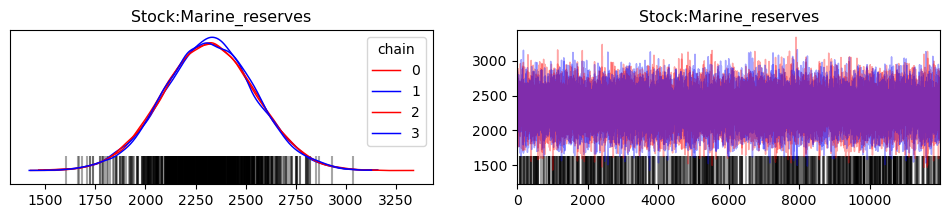

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


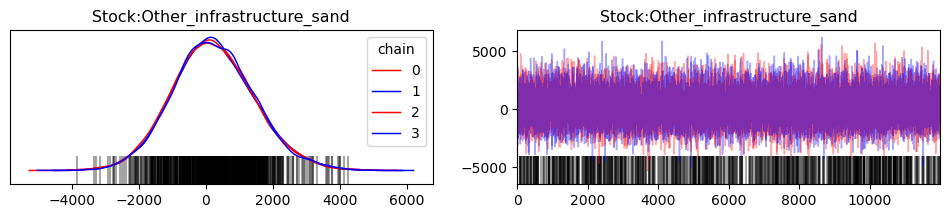

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


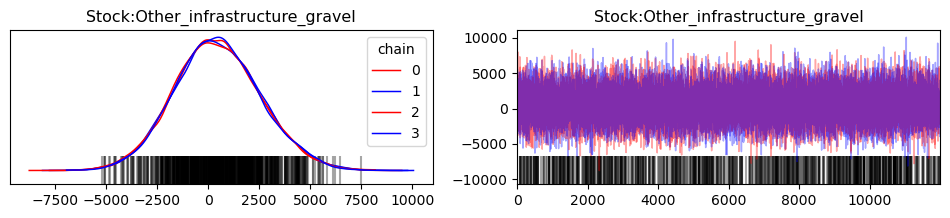

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


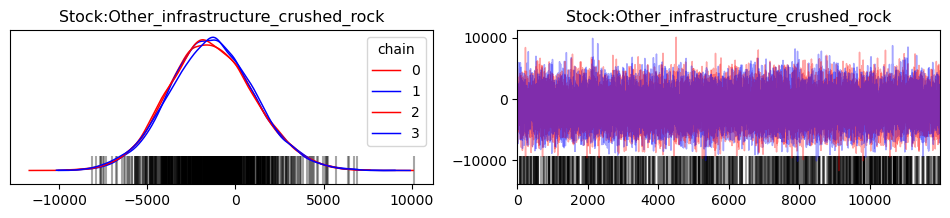

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


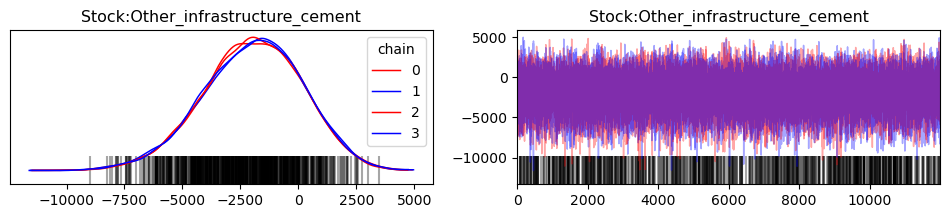

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


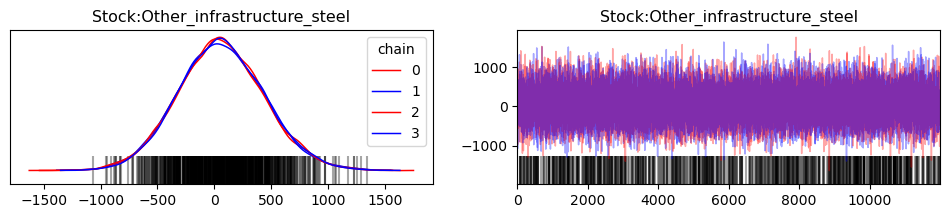

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


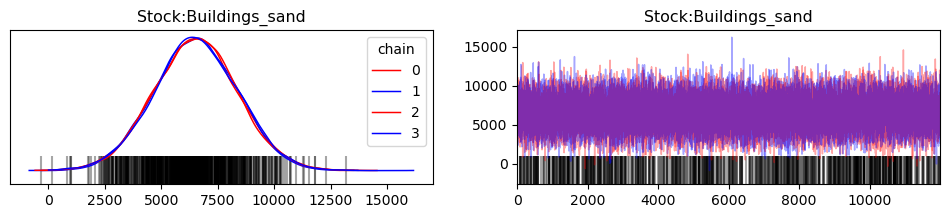

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


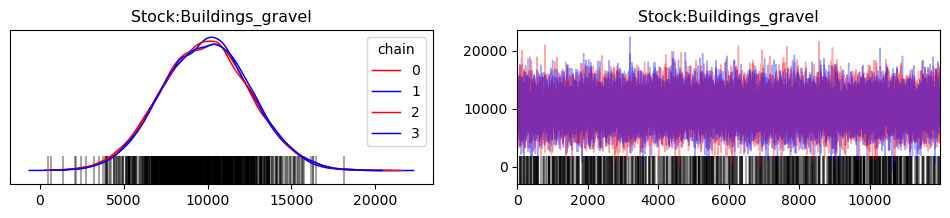

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


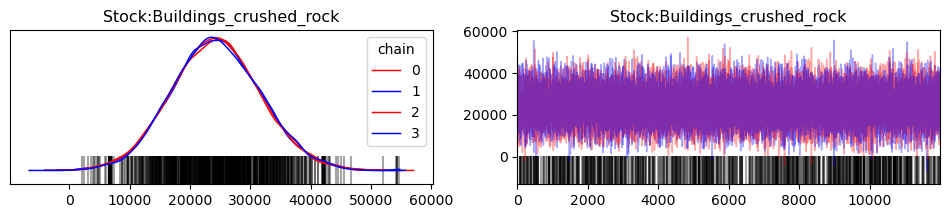

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


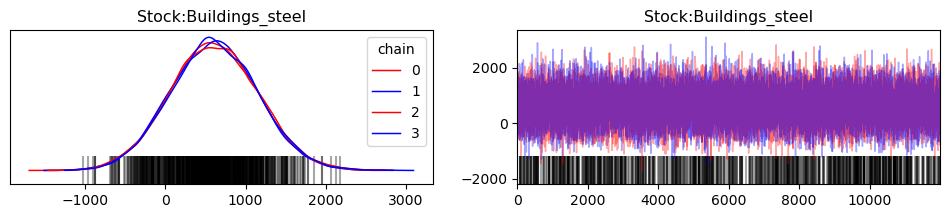

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


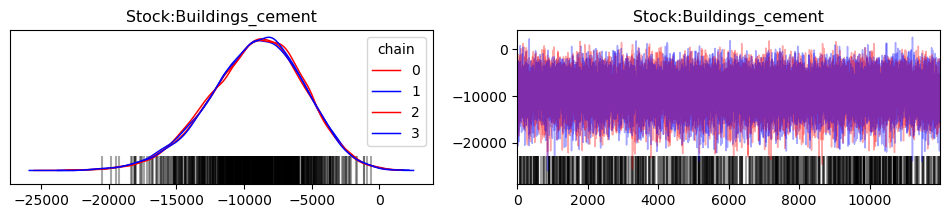

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


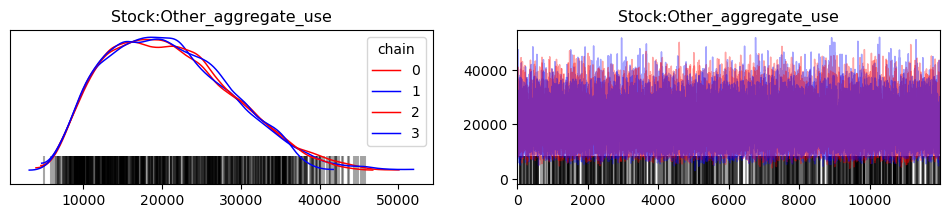

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


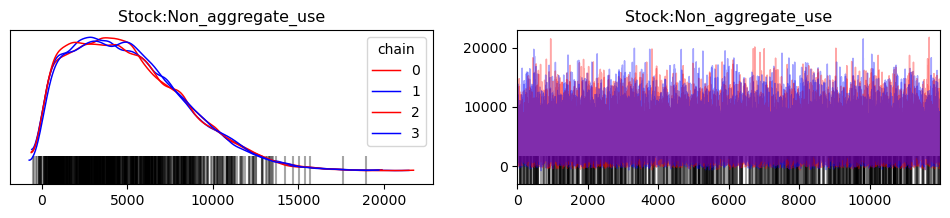

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


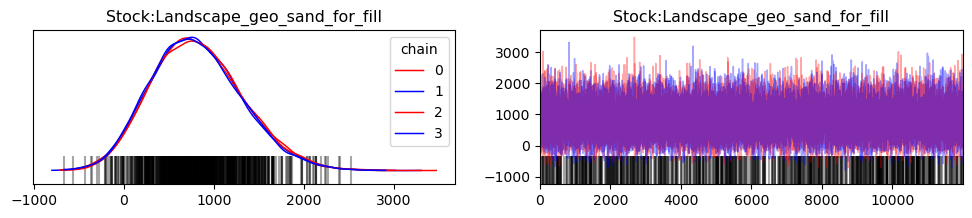

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


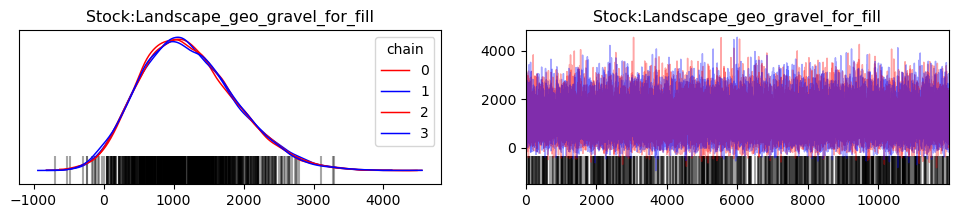

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


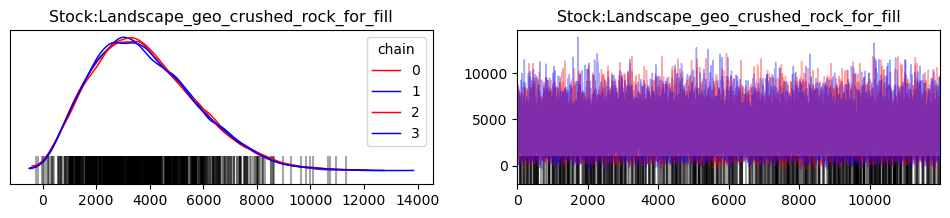

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


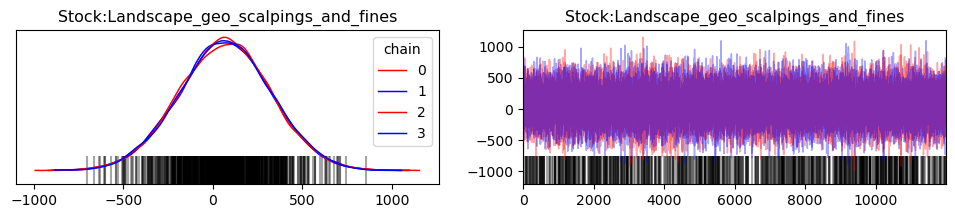

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


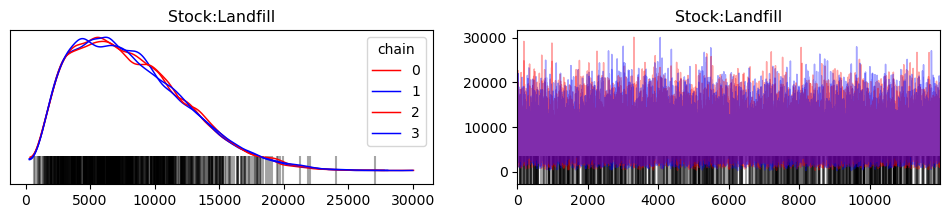

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


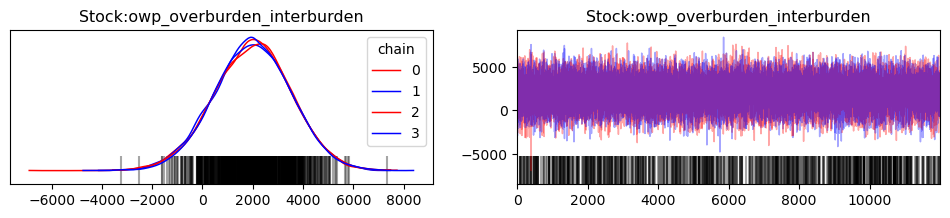

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


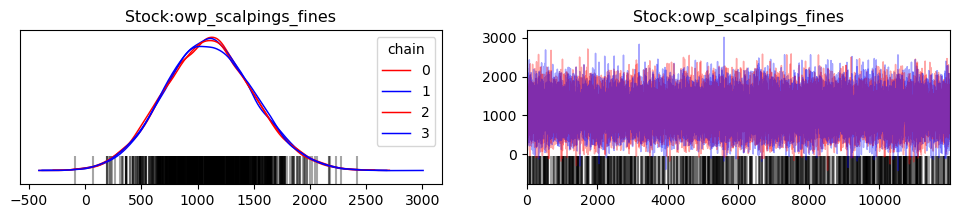

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


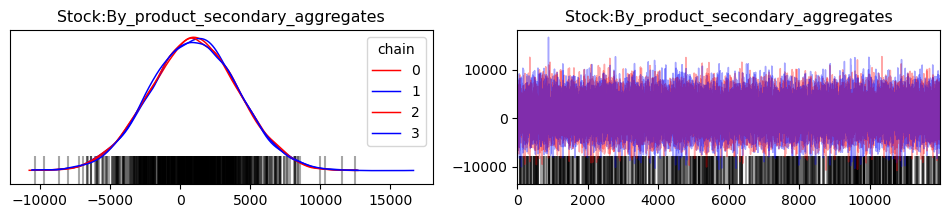

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


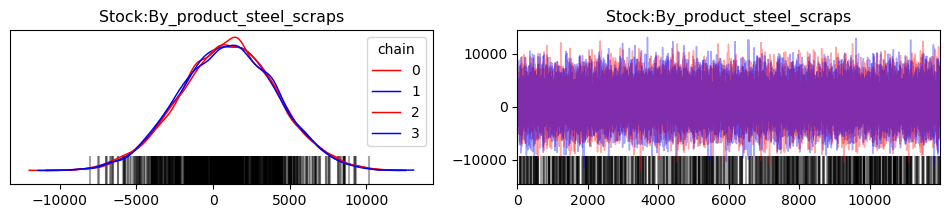

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


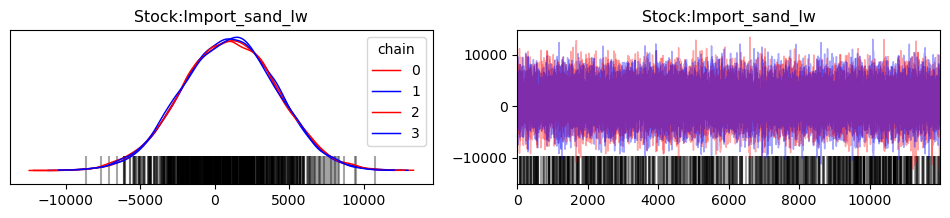

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


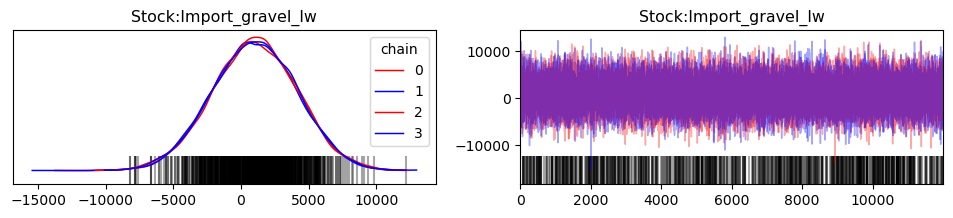

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


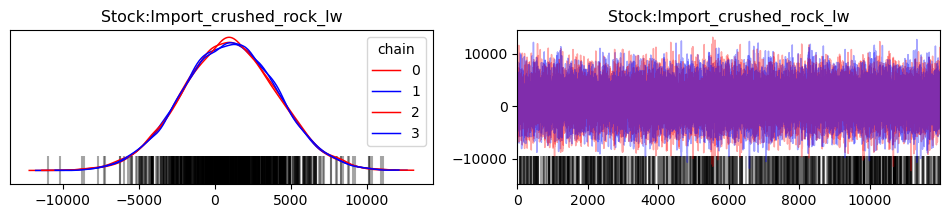

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


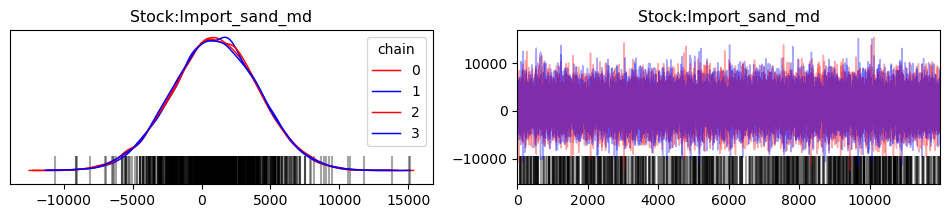

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


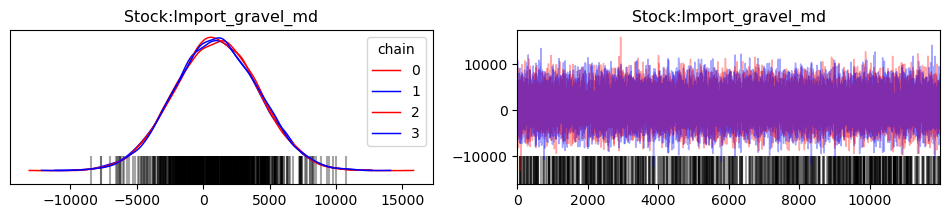

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


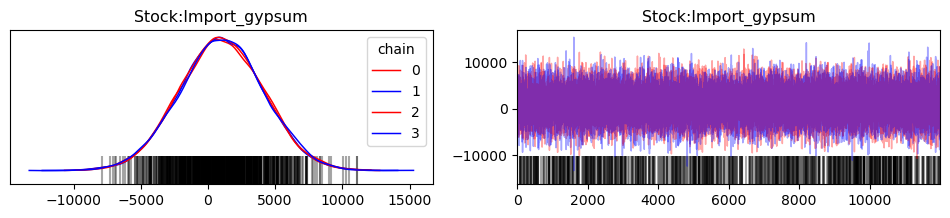

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


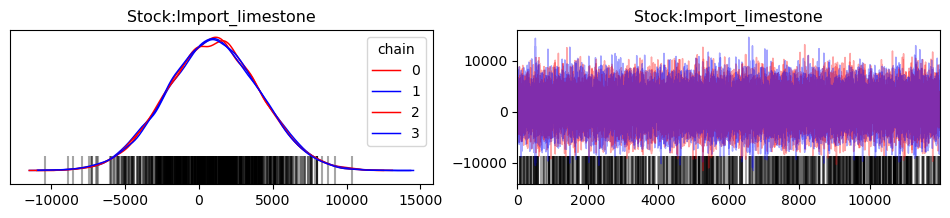

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


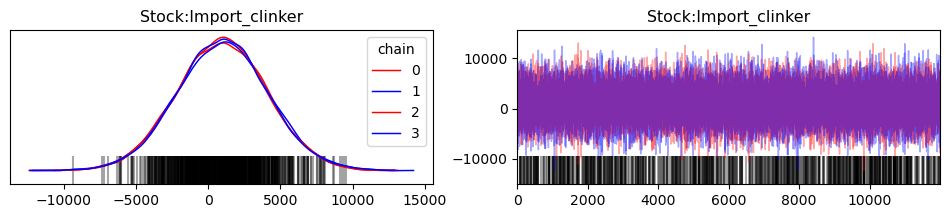

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


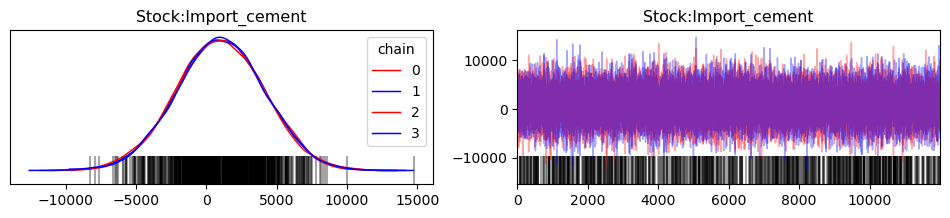

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


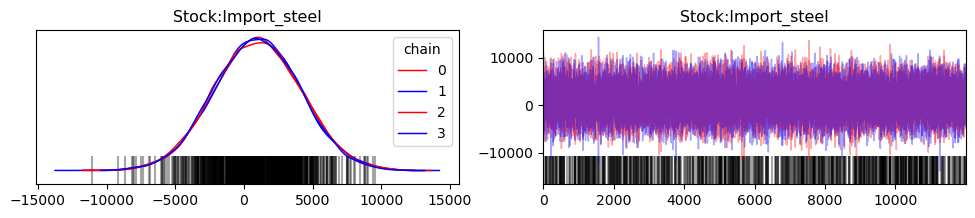

In [4]:
#generate traceplots for the change in stock variables

labels=[processnamesdict[str(x)] for x in availablechildstocks]

import arviz.labels as azl

plt.tight_layout()
for i in range(0,len(labels)):
    
    labeller = azl.MapLabeller(var_name_map={"stocks": r"Stock"+":"+labels[i]})
    
    posteriorstocktraceplots=az.plot_trace(trace, var_names="stocks",compact=True,show=True,backend="matplotlib", coords={'stocks_dim_0': [i]},labeller=labeller,legend=True,chain_prop={"color": ['r', 'b']})

    #posteriorstocktraceplots[0,0].get_figure().savefig("outputgraphstrace"+filelabeler(useratiodata)+"/"+"Stocktrace"+"_"+labels[i]+filelabeler(useratiodata)+".pdf")

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


<Figure size 640x480 with 0 Axes>

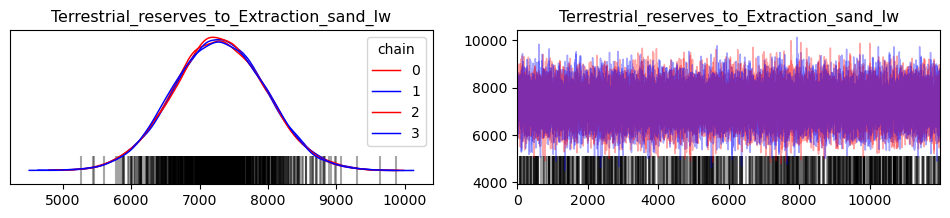

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


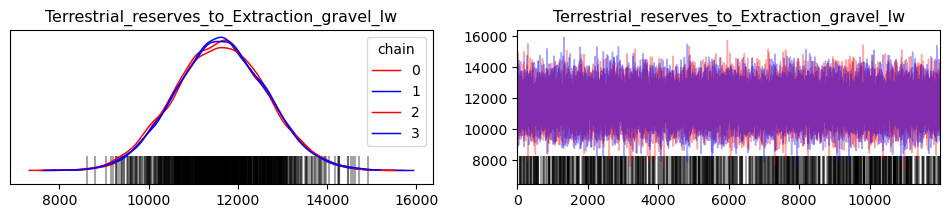

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


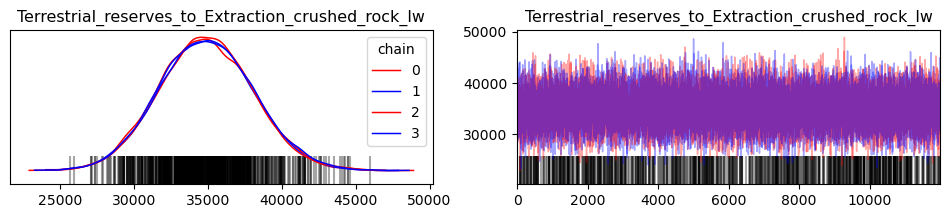

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


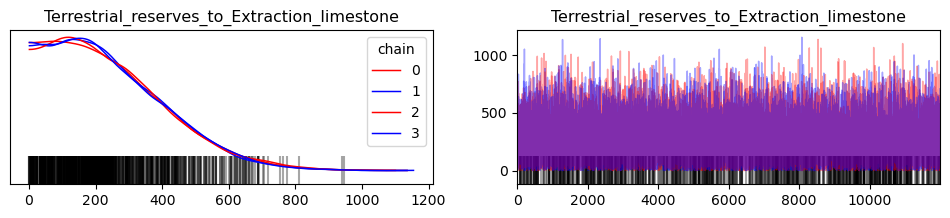

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


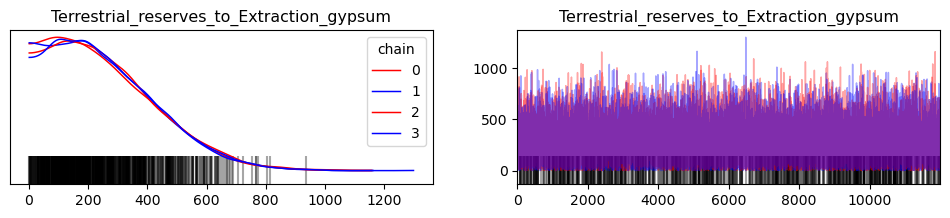

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


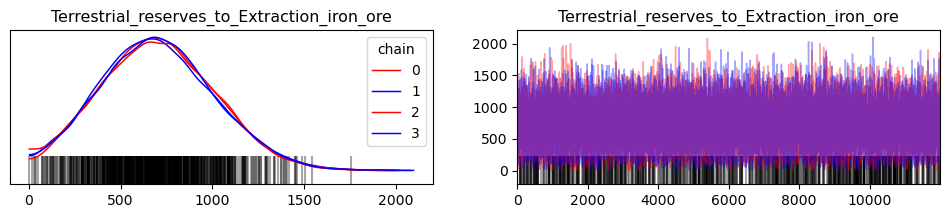

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


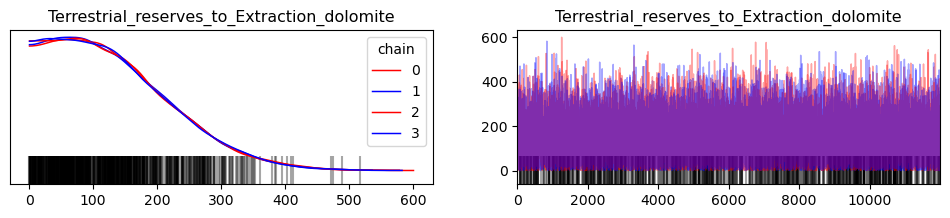

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


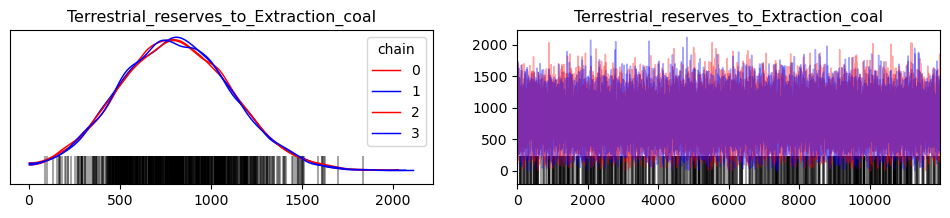

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


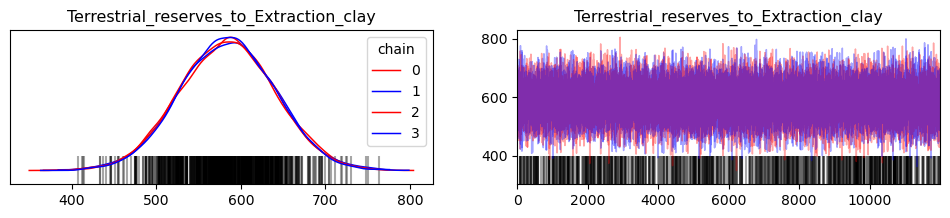

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


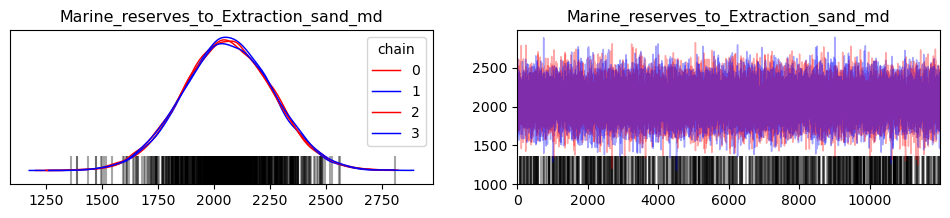

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


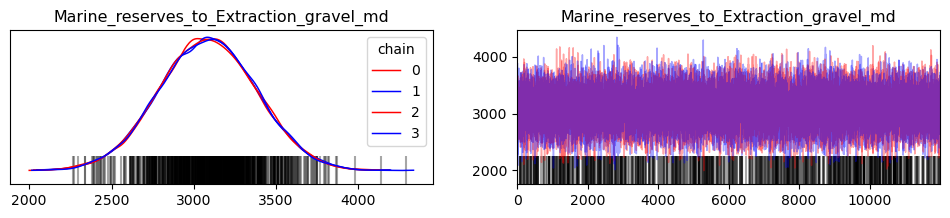

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


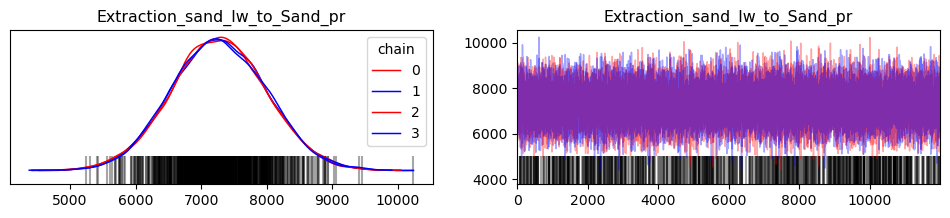

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


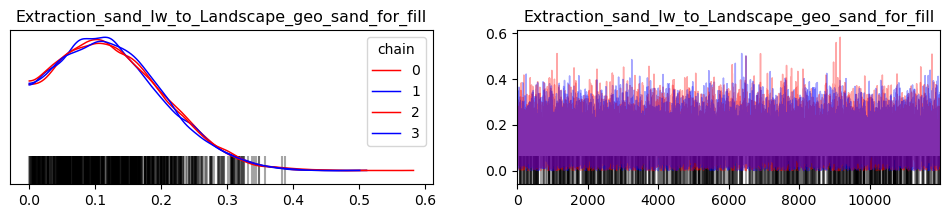

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


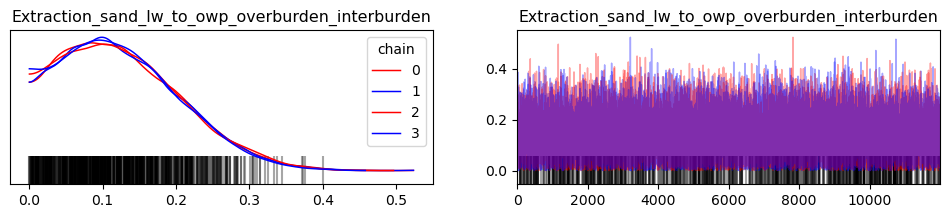

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


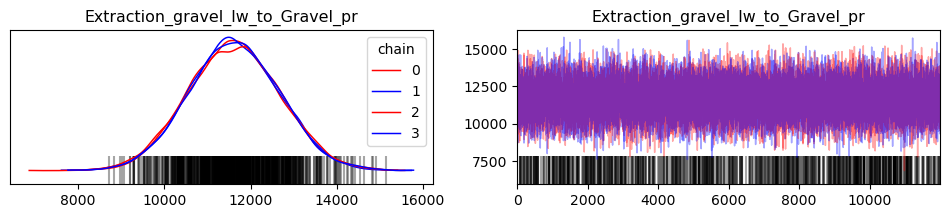

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


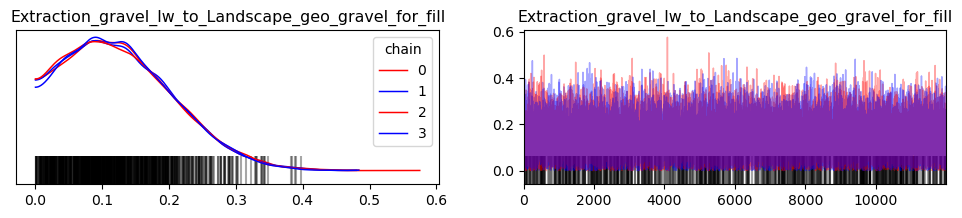

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


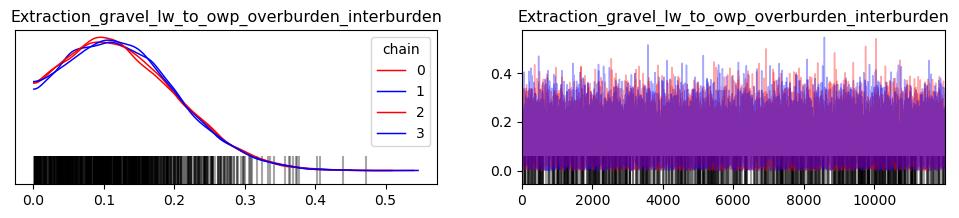

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


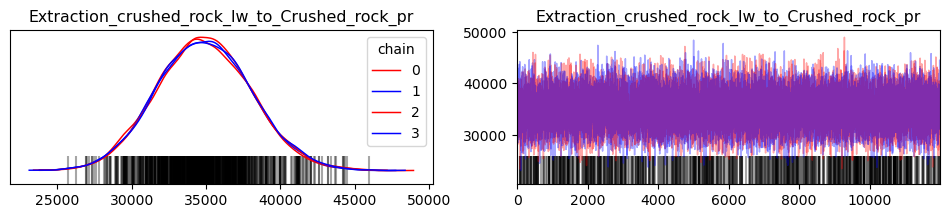

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


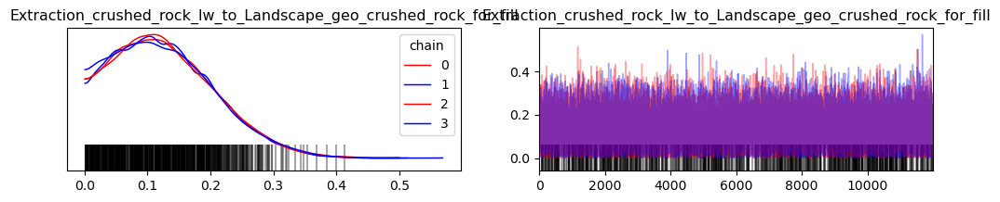

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


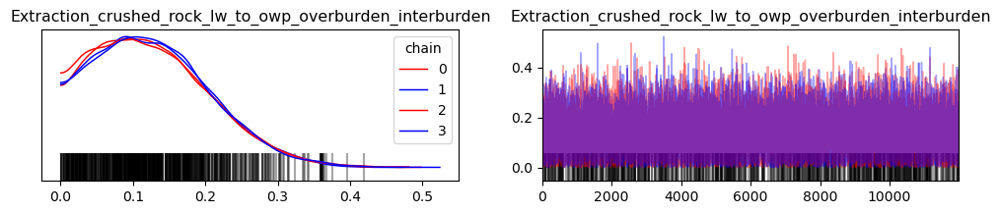

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


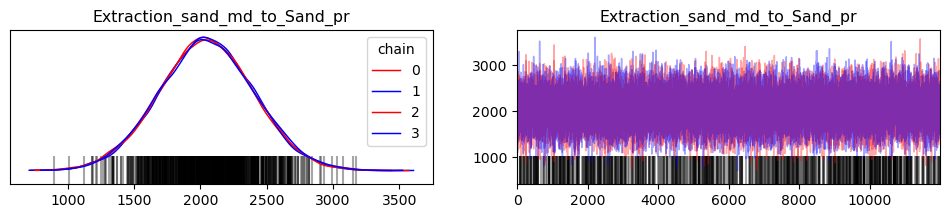

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


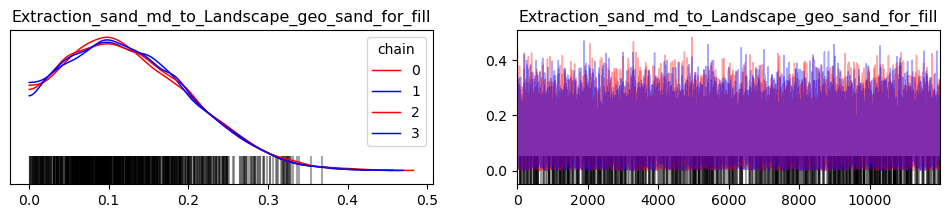

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


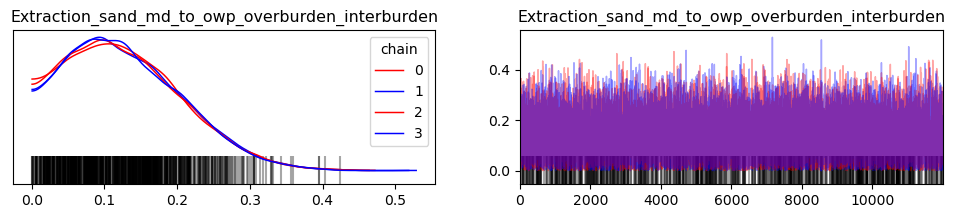

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


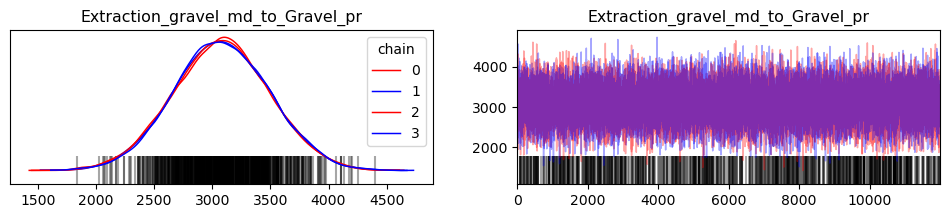

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


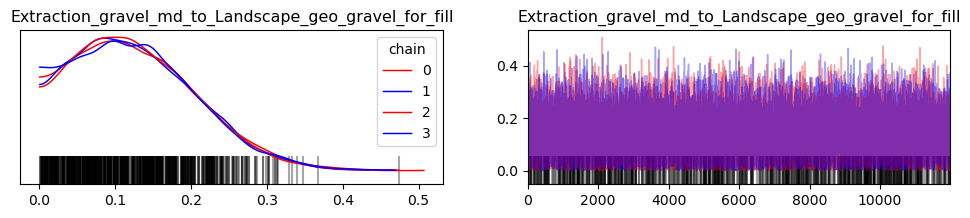

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


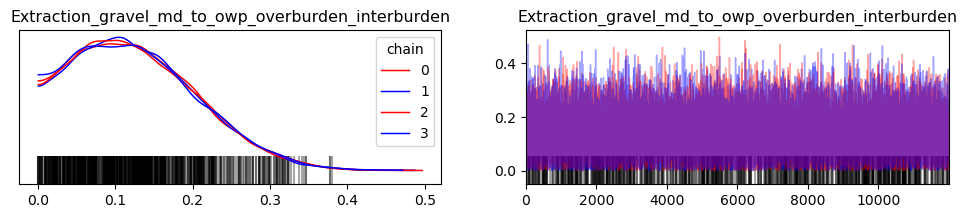

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


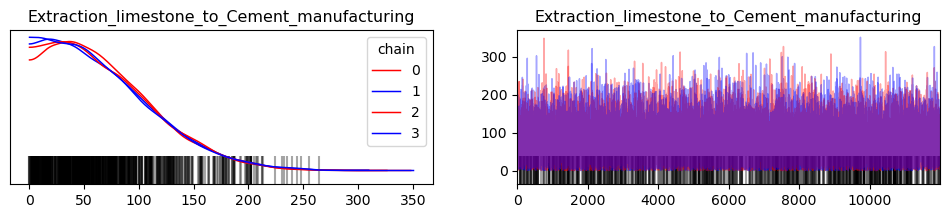

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


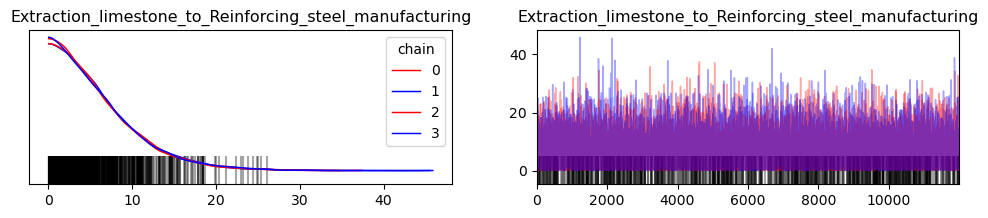

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


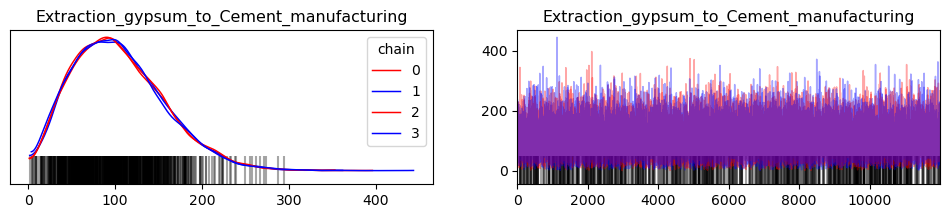

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


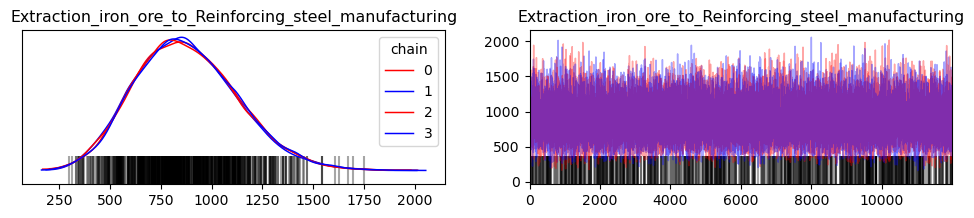

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


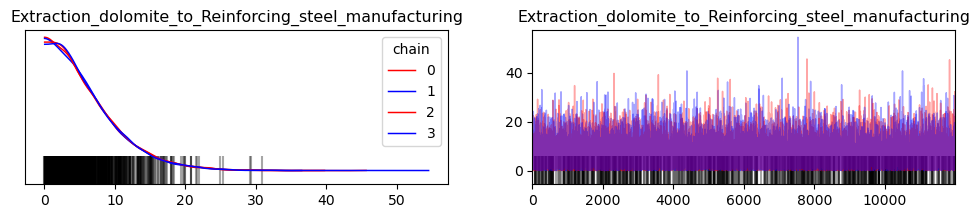

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


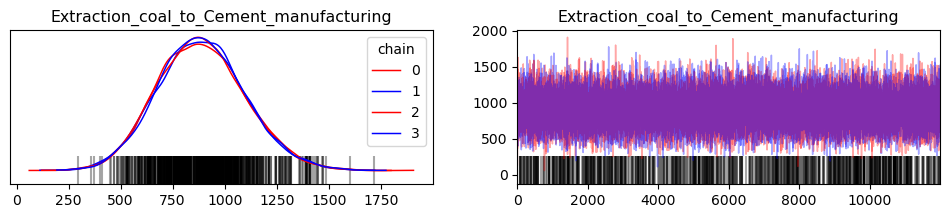

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


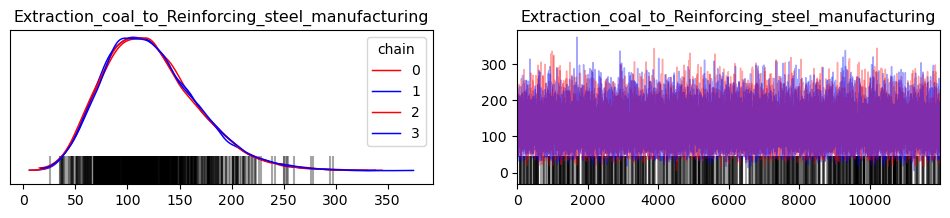

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


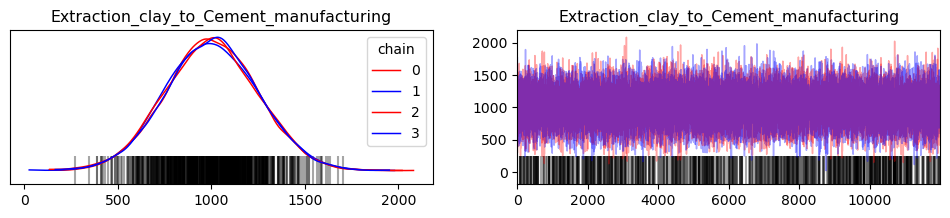

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


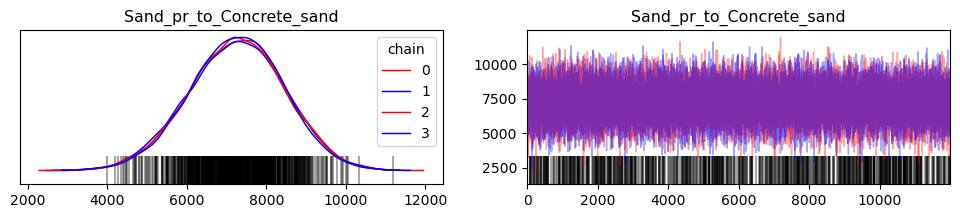

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


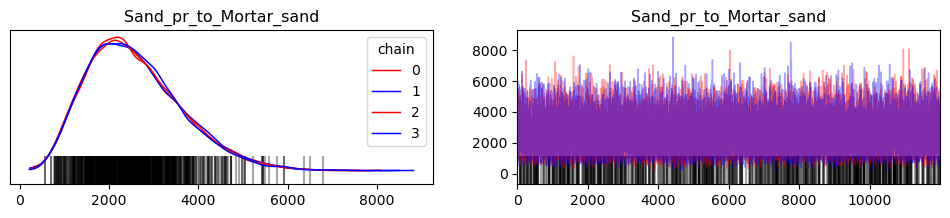

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


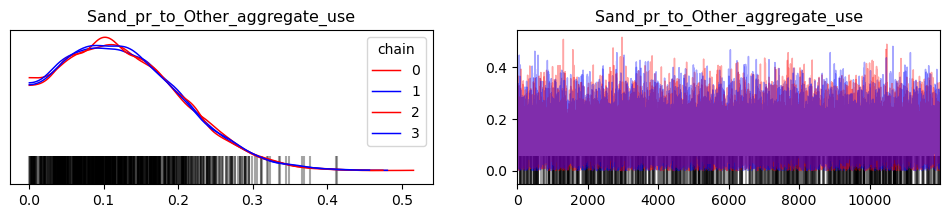

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


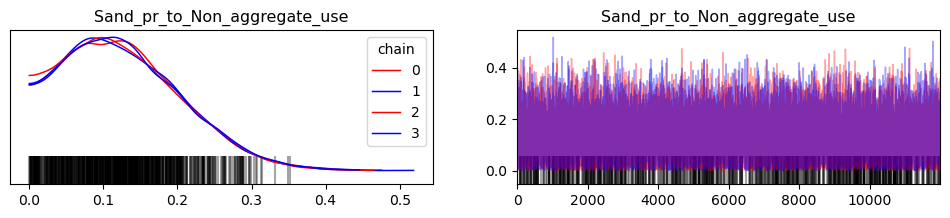

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


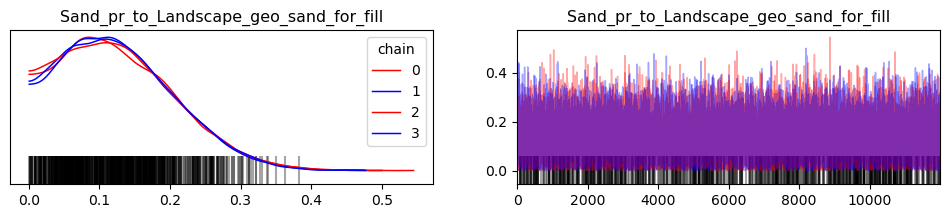

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


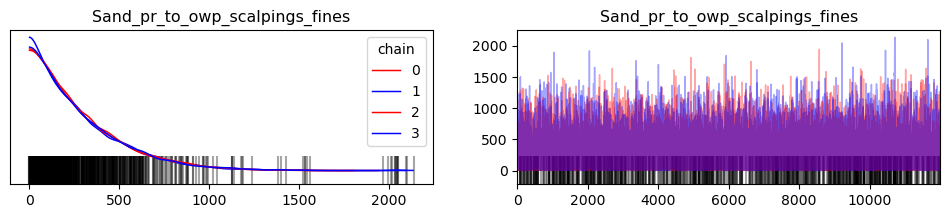

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


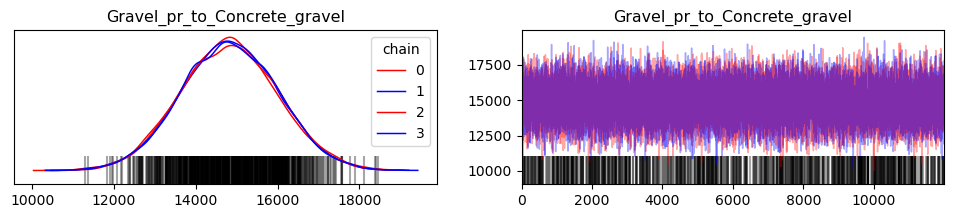

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


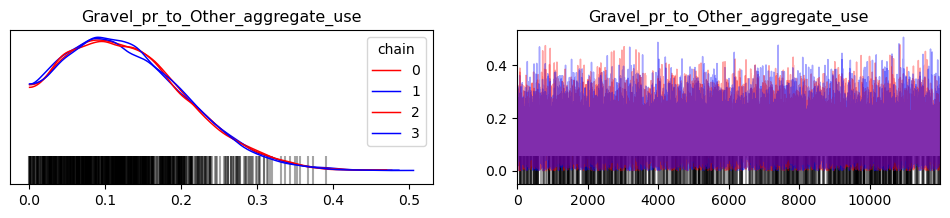

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


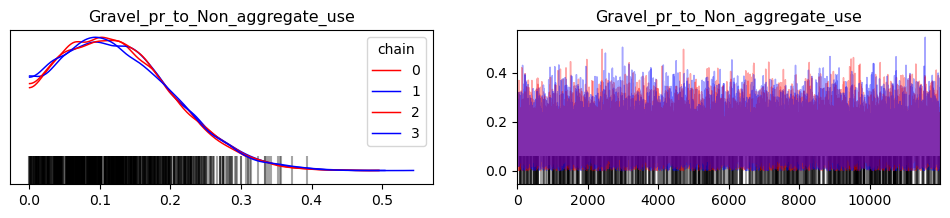

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


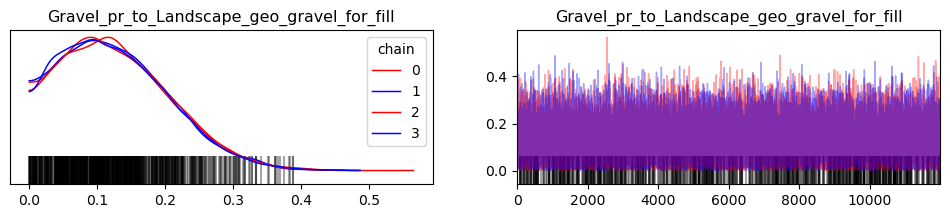

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


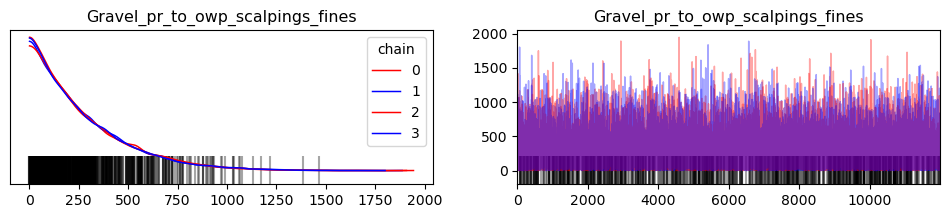

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


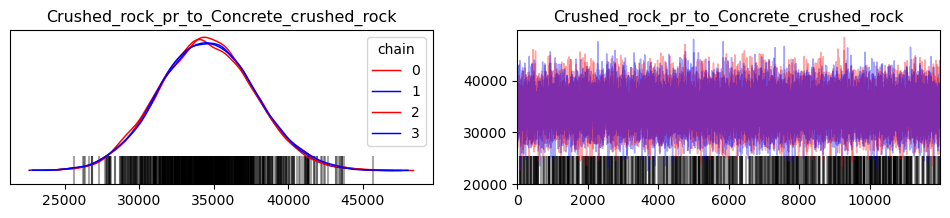

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


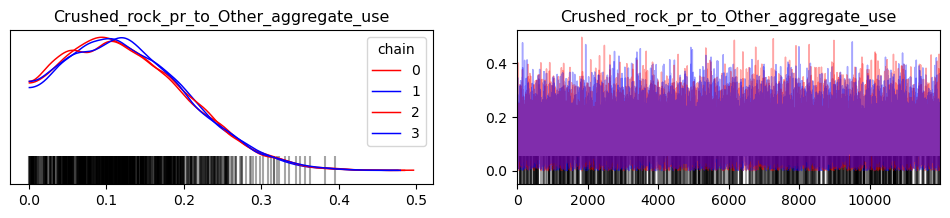

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


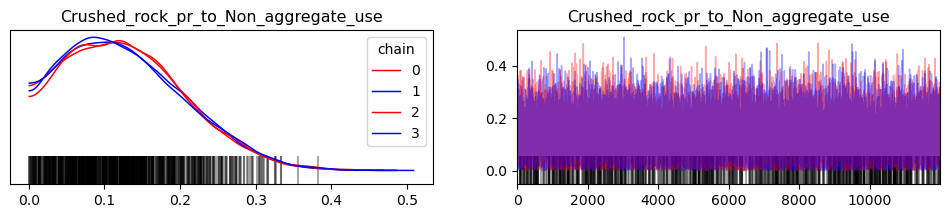

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


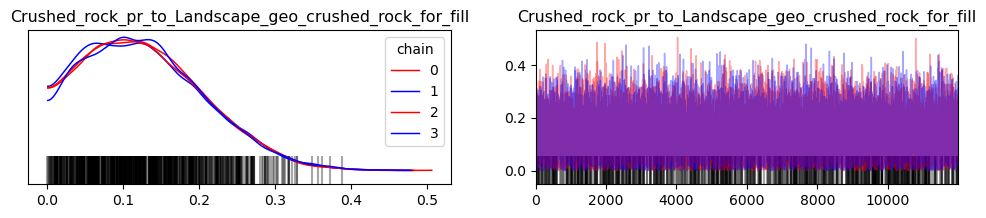

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


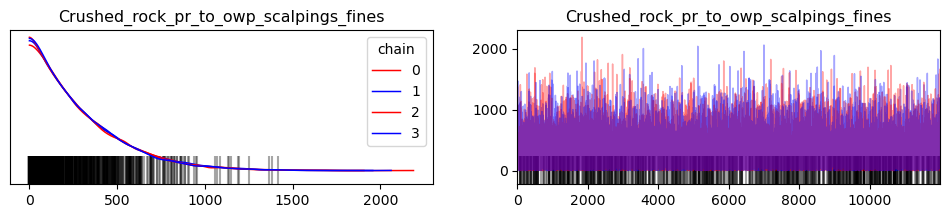

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


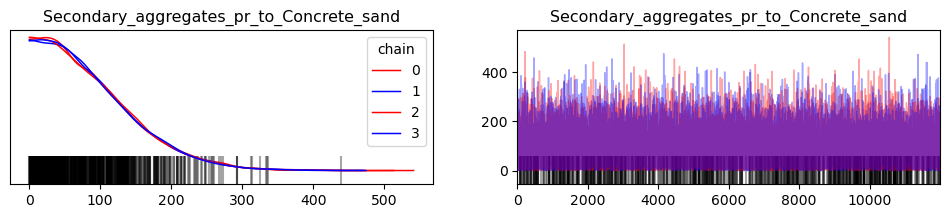

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


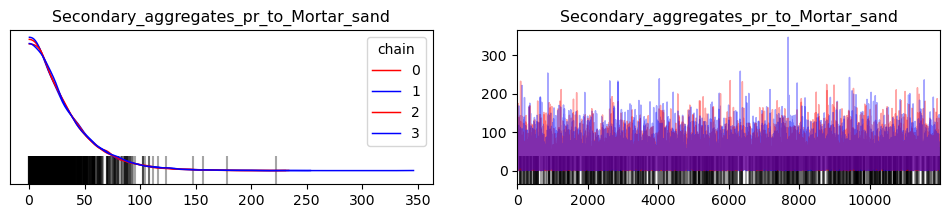

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


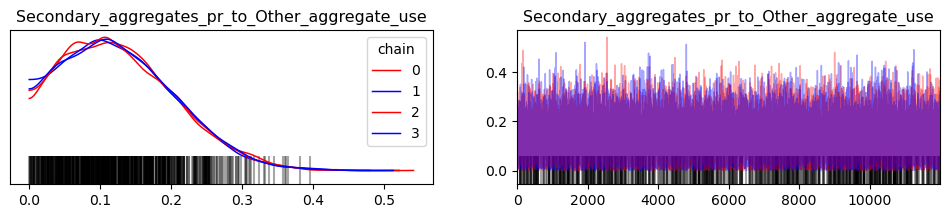

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


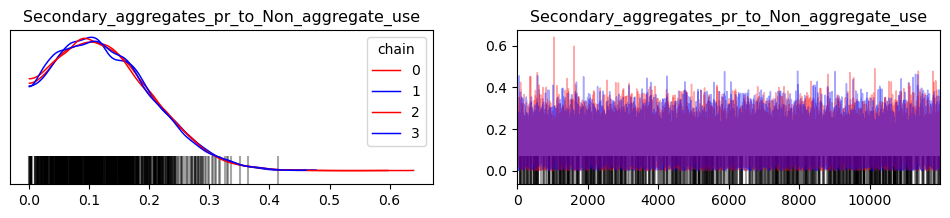

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


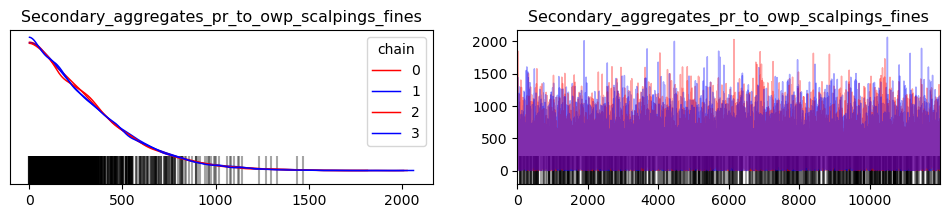

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


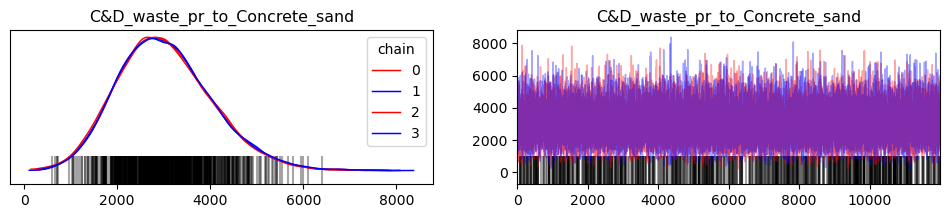

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


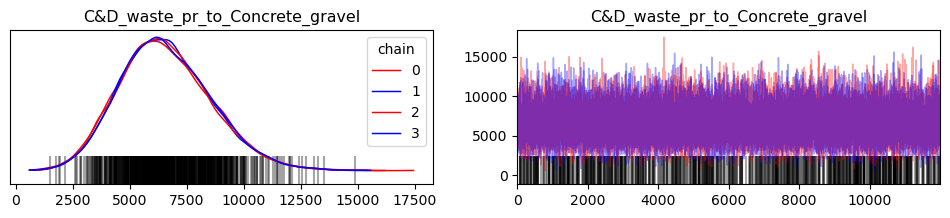

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


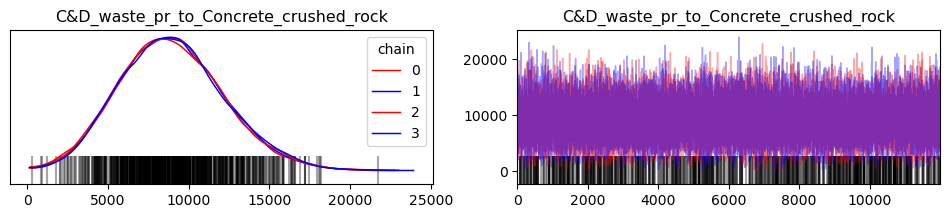

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


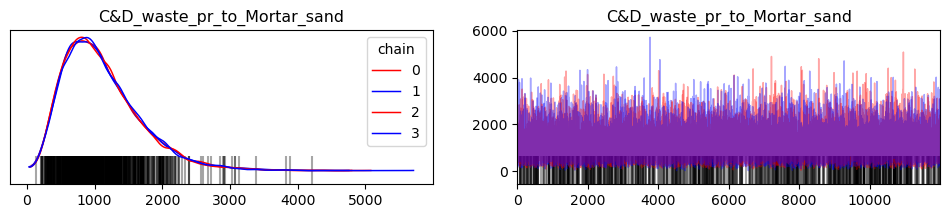

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


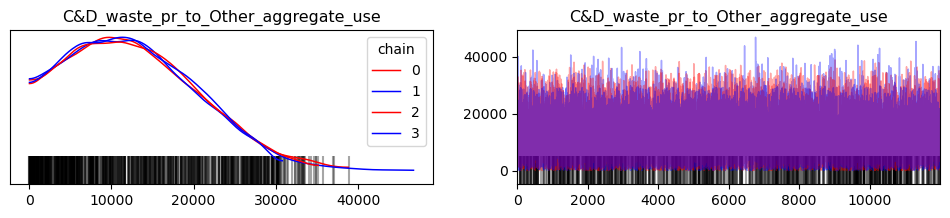

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


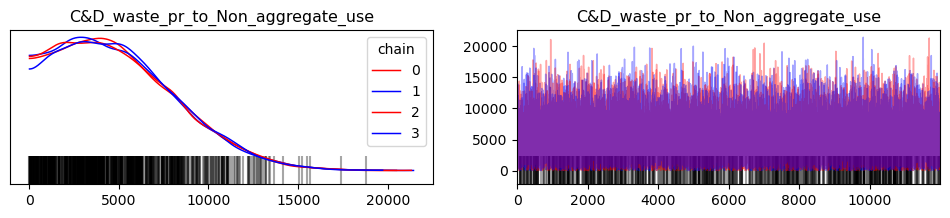

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


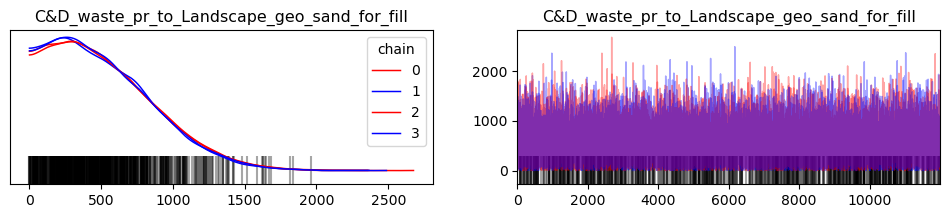

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


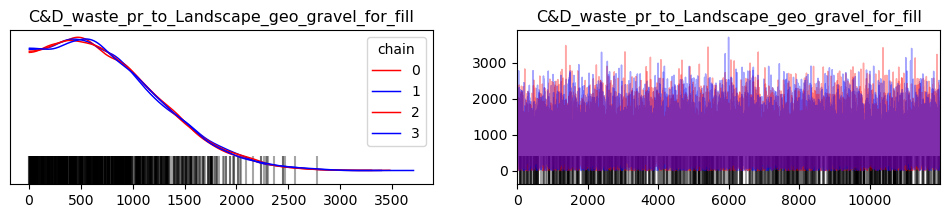

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


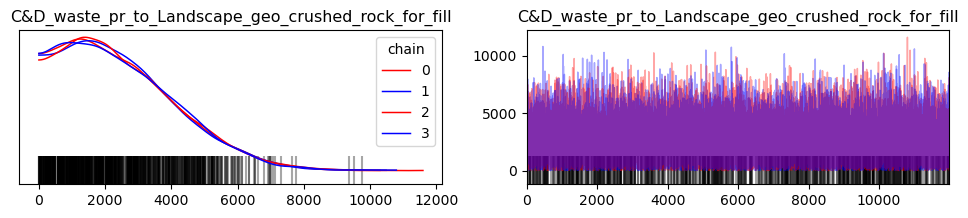

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


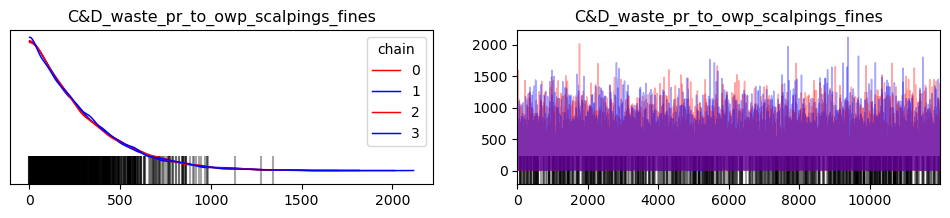

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


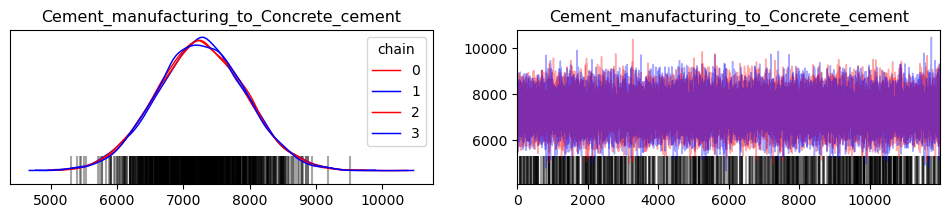

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


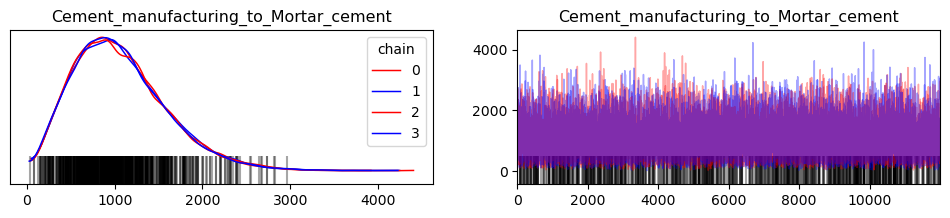

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


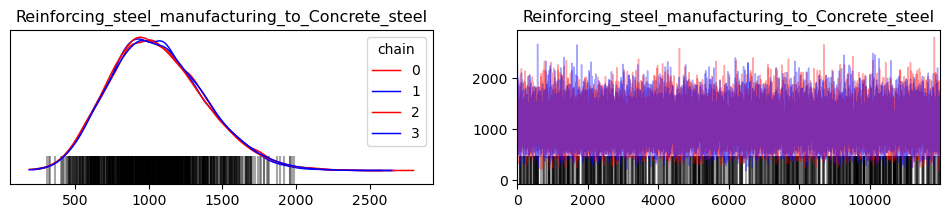

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


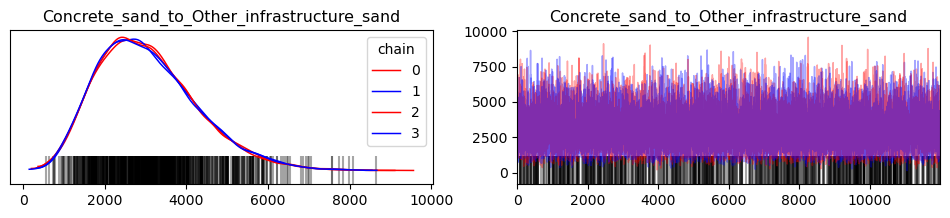

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


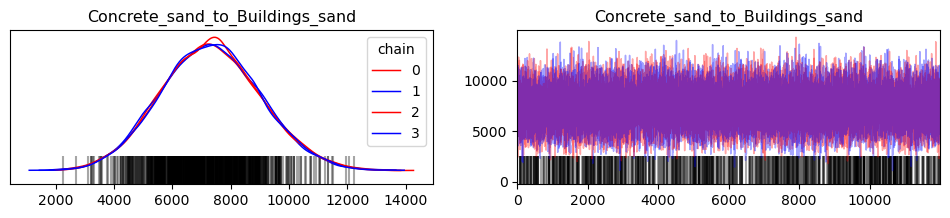

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


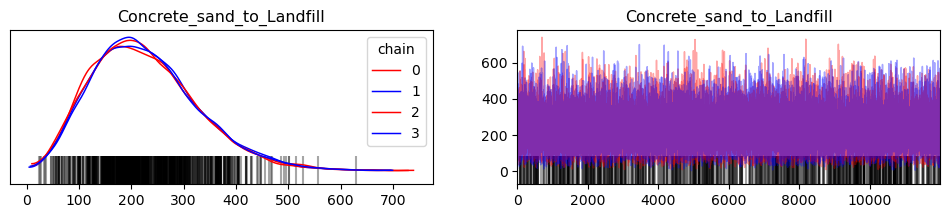

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


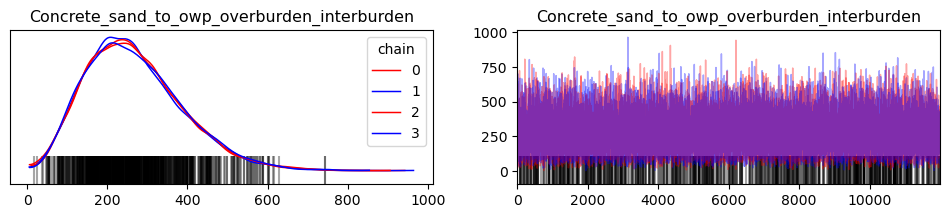

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


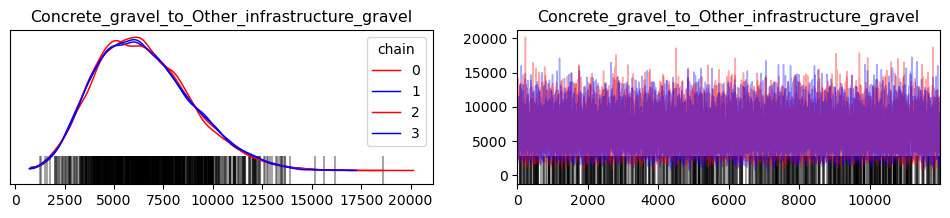

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


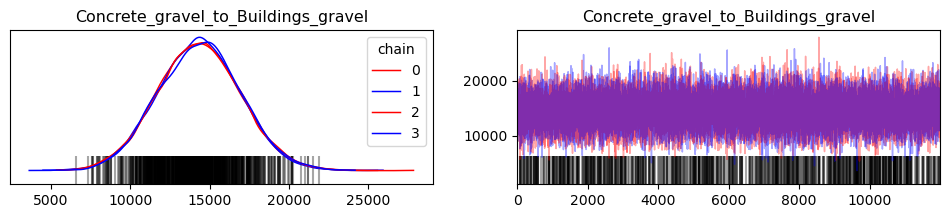

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


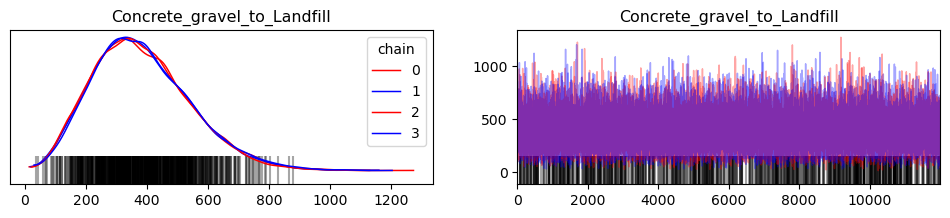

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


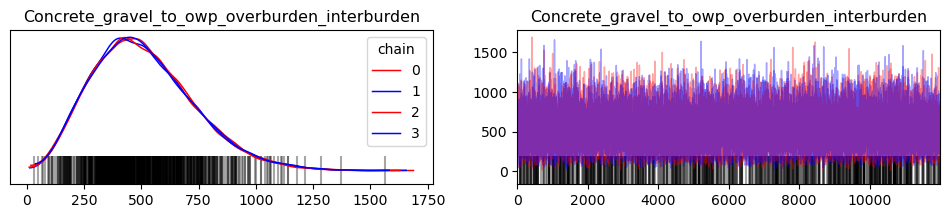

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


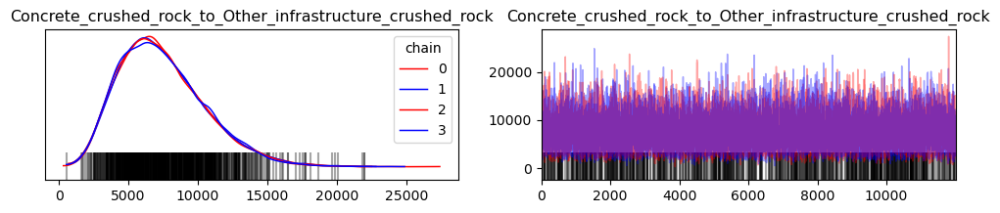

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


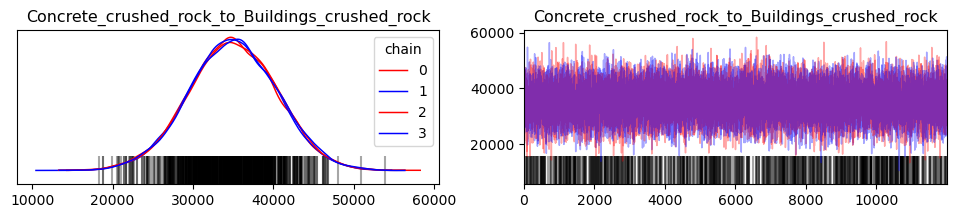

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


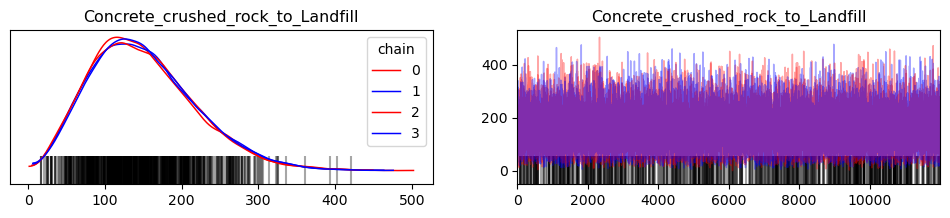

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


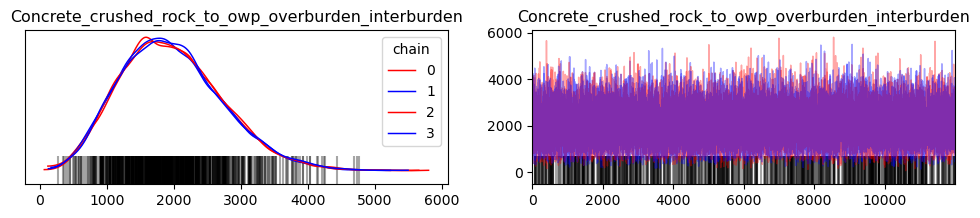

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


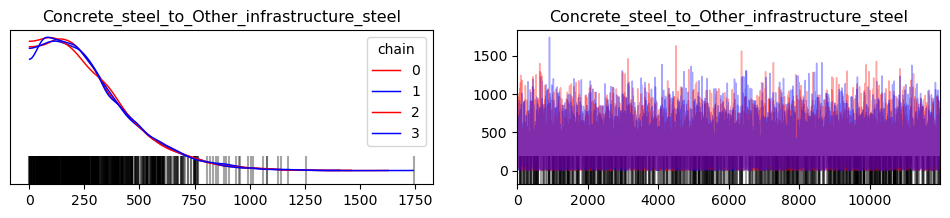

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


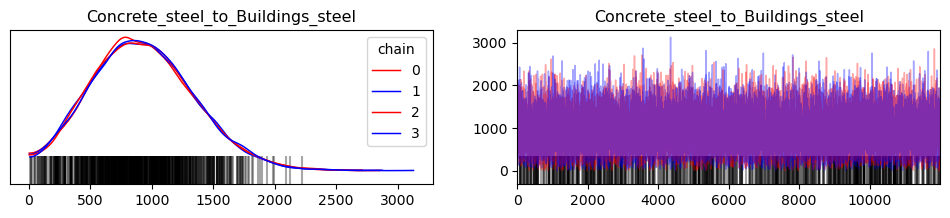

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


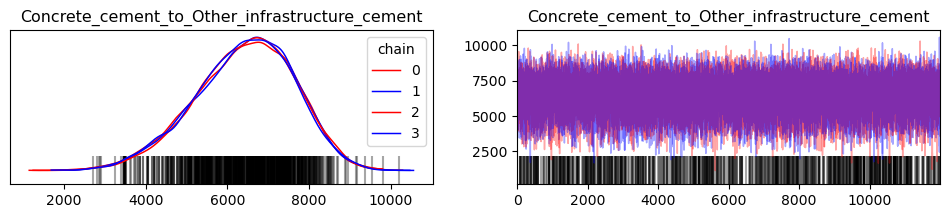

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


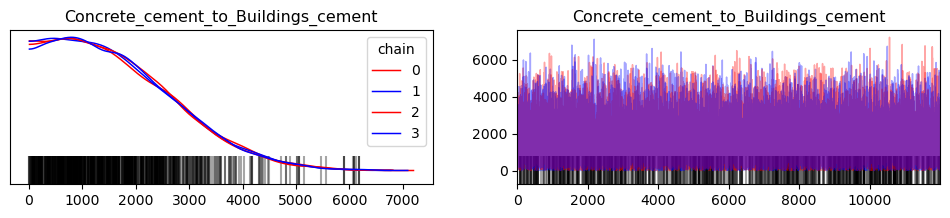

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


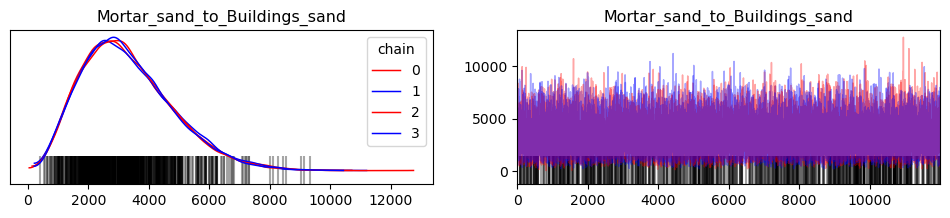

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


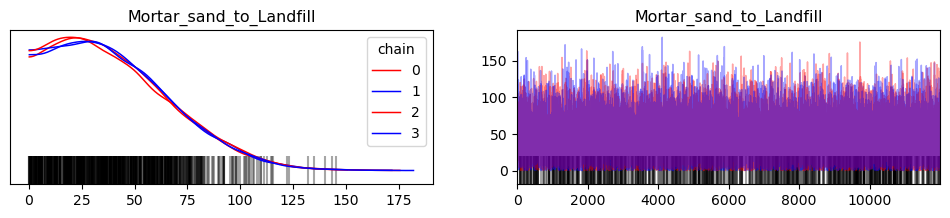

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


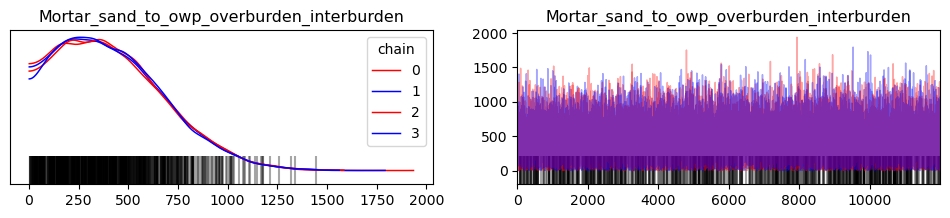

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


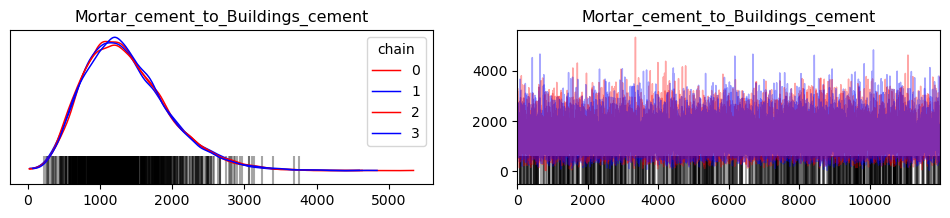

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


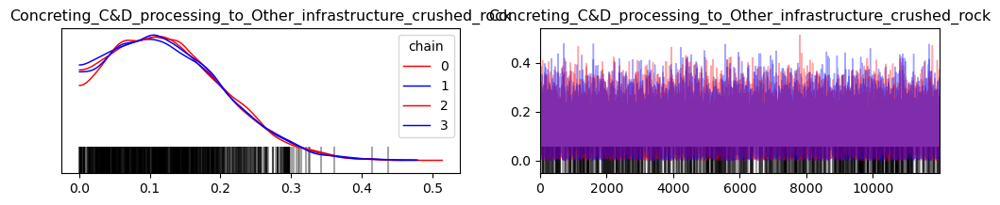

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


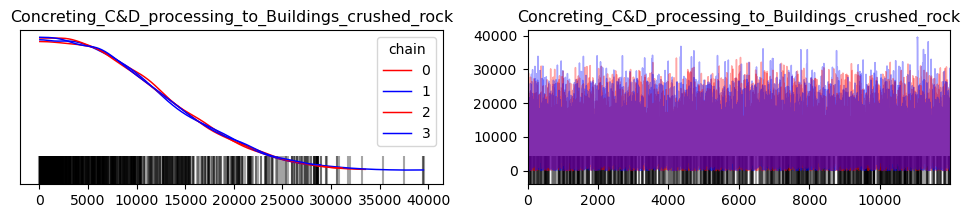

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


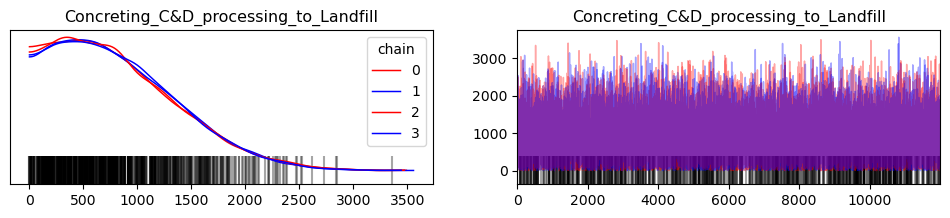

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


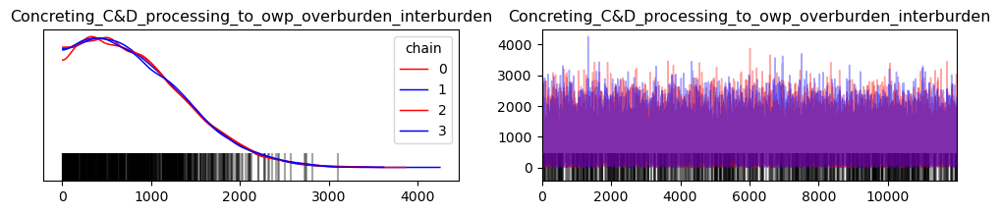

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


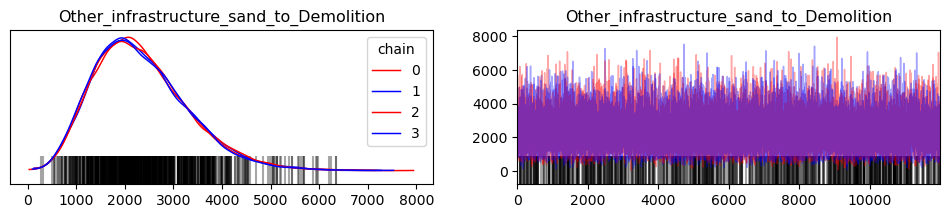

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


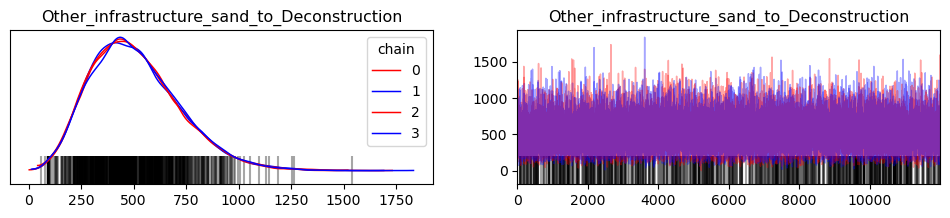

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


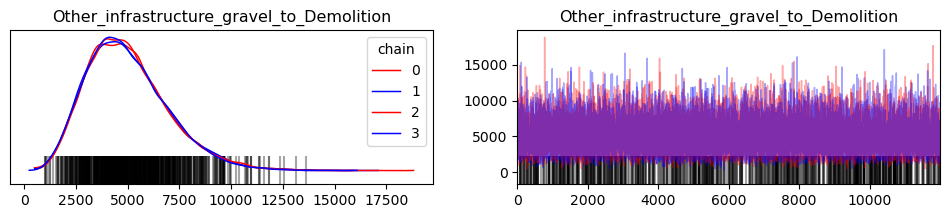

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


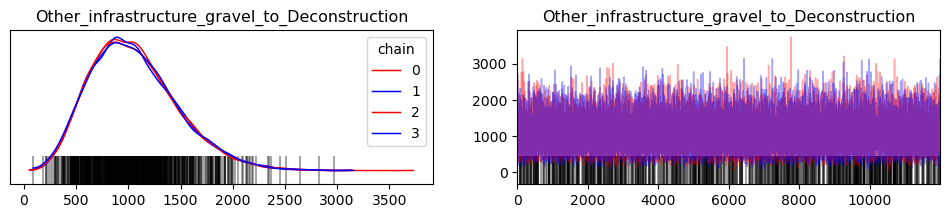

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


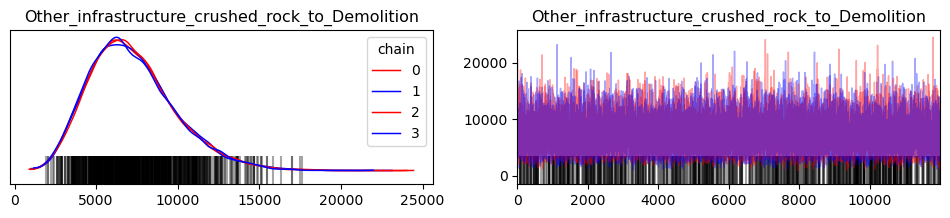

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


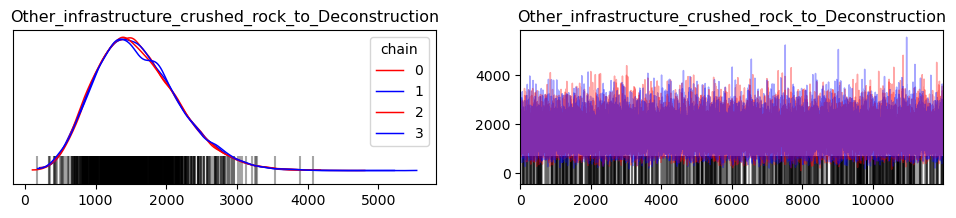

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


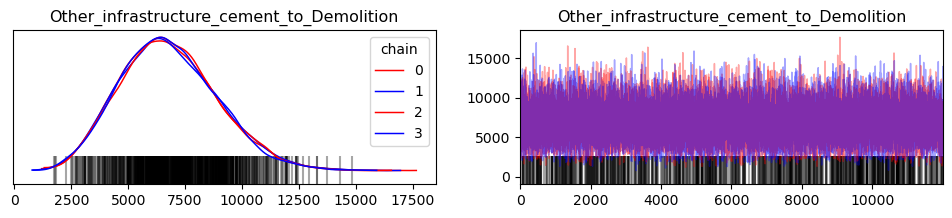

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


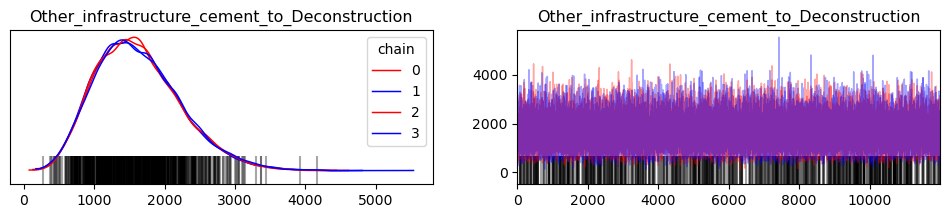

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


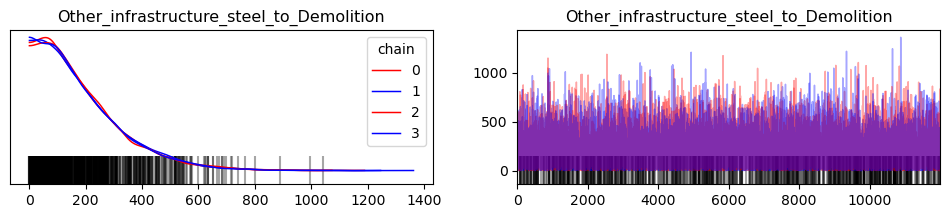

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


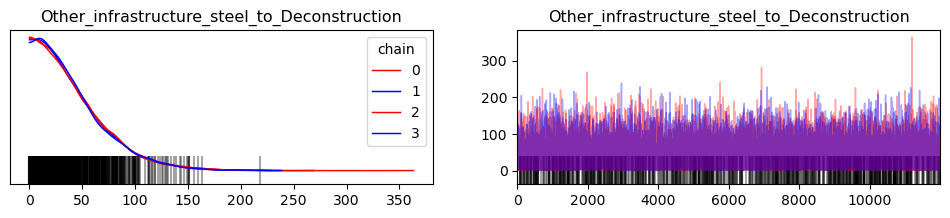

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


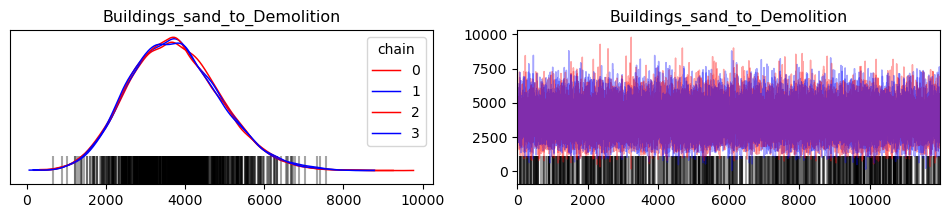

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


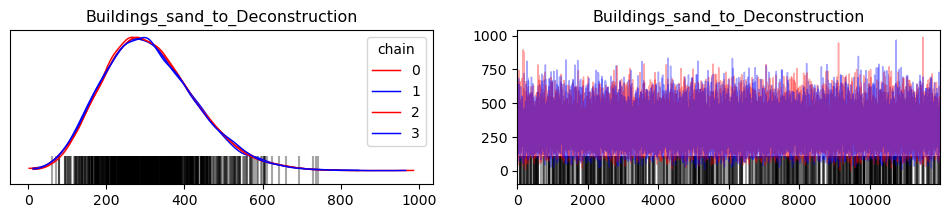

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


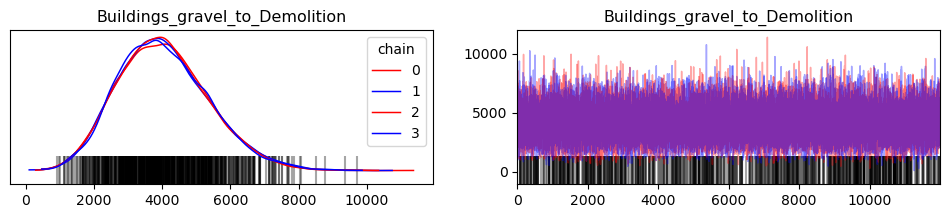

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


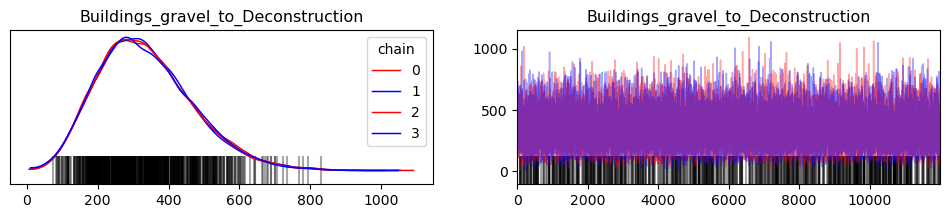

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


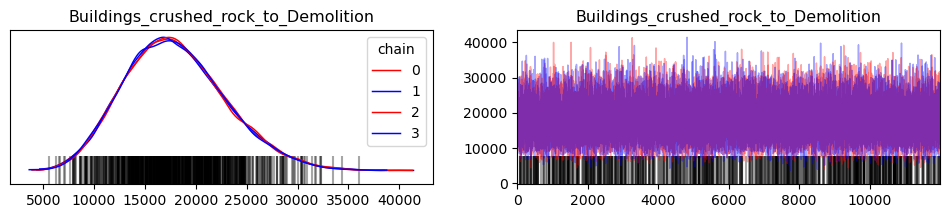

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


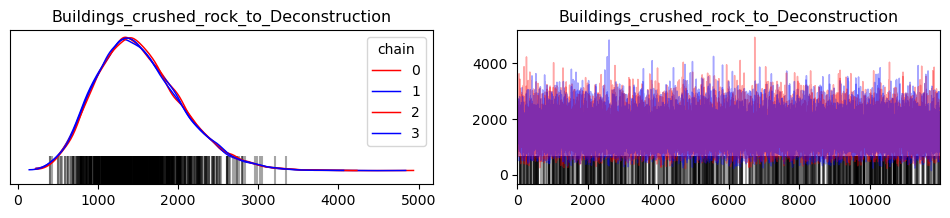

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


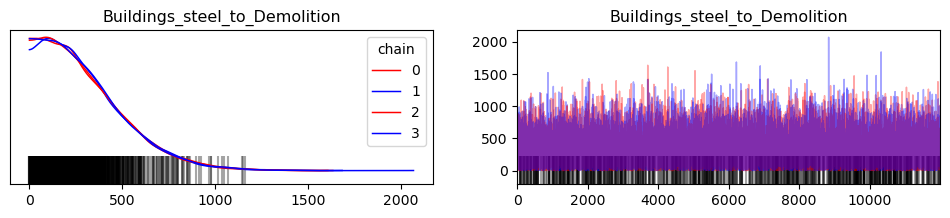

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


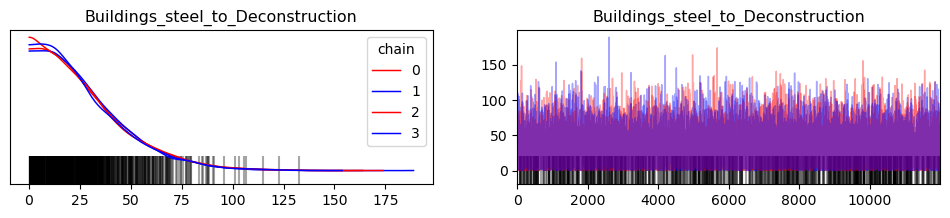

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


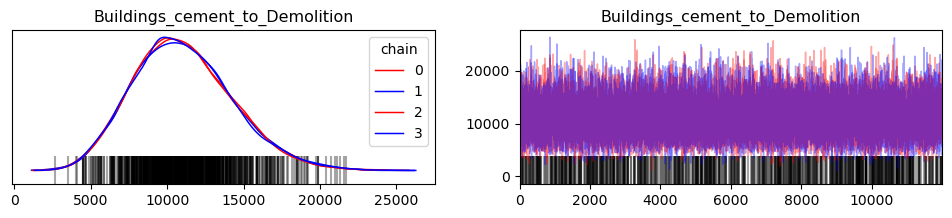

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


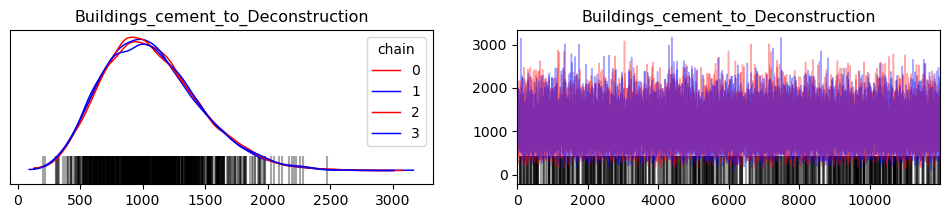

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


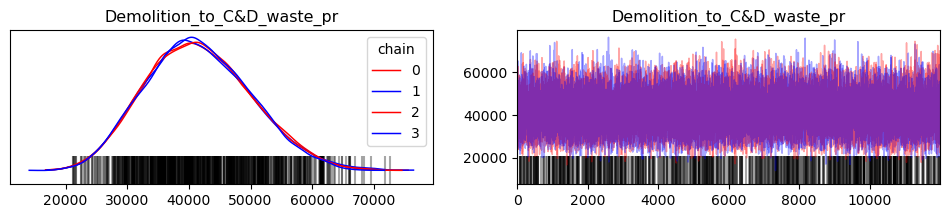

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


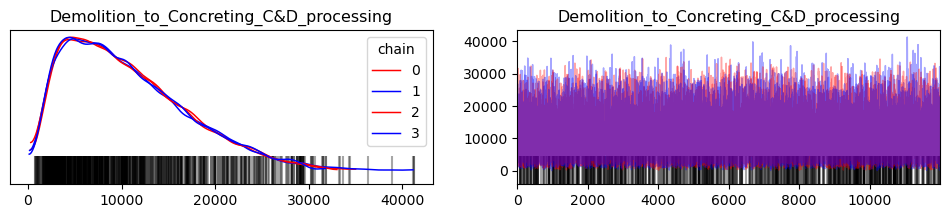

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


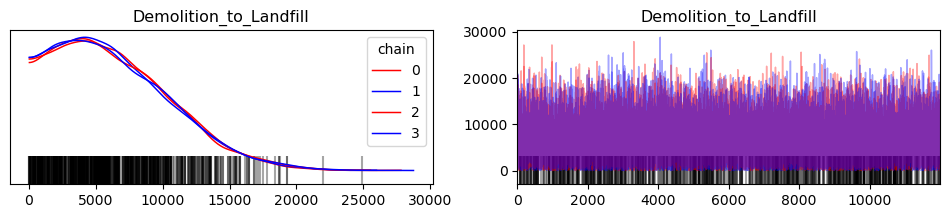

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


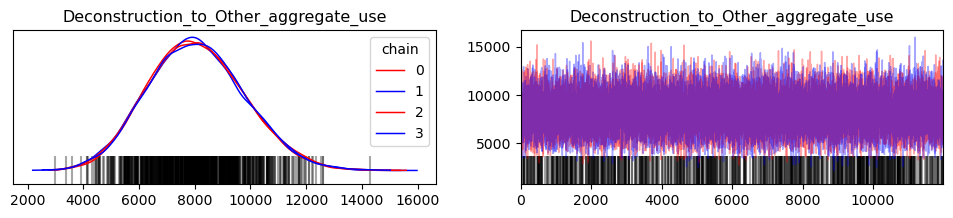

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


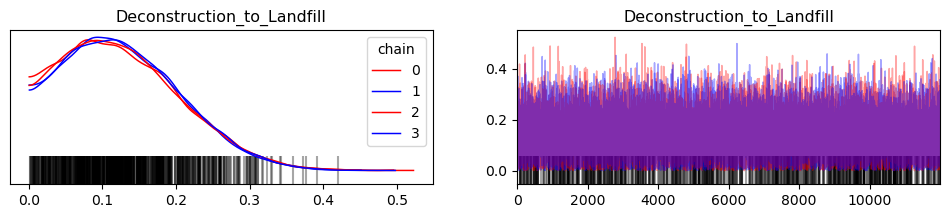

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


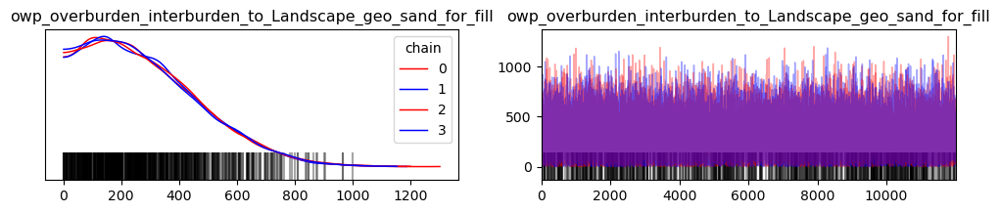

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


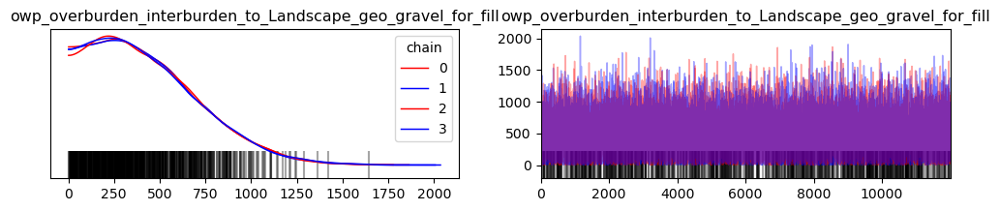

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


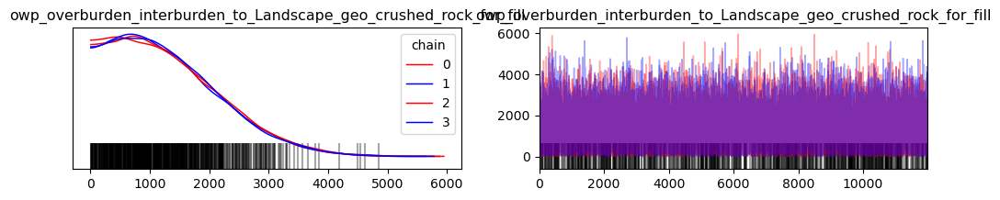

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


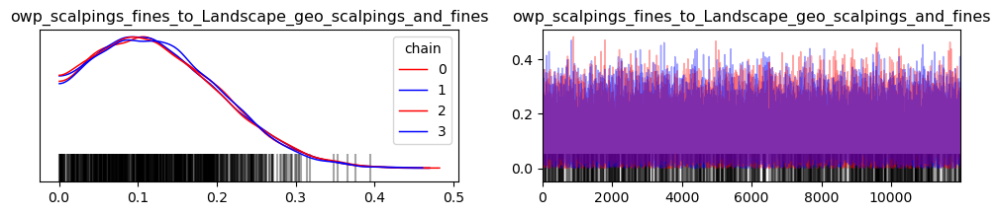

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


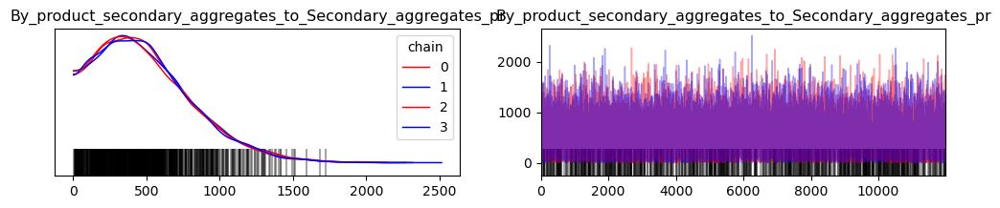

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


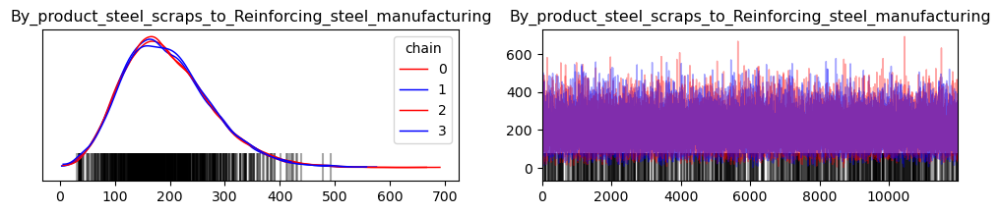

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


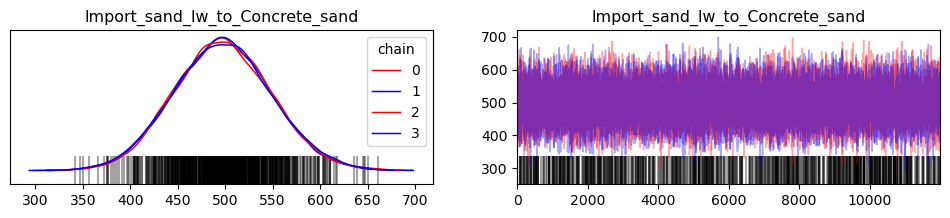

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


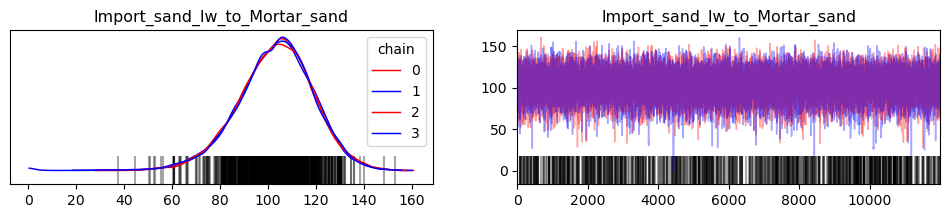

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


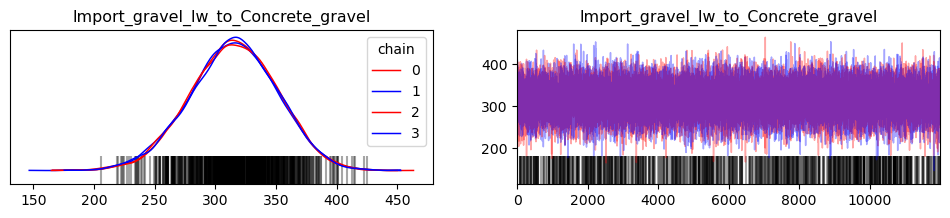

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


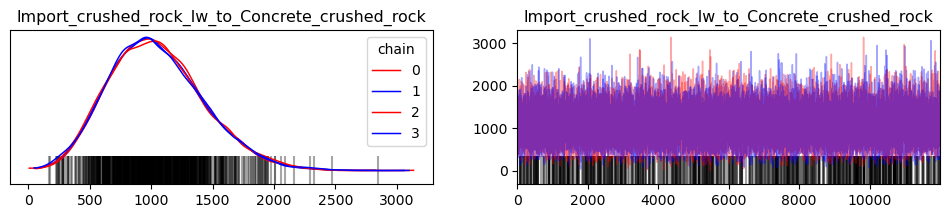

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


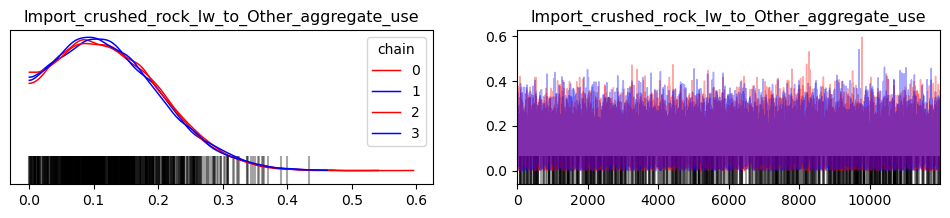

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


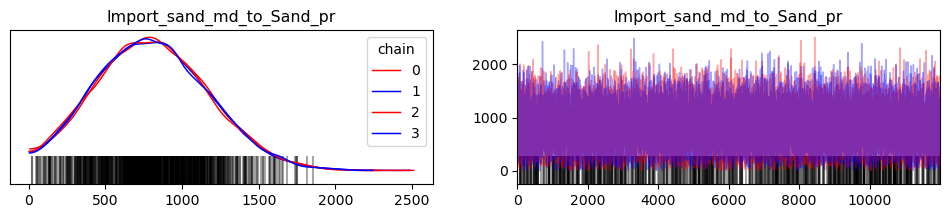

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


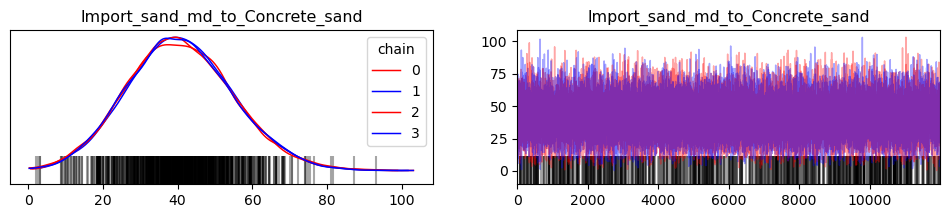

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


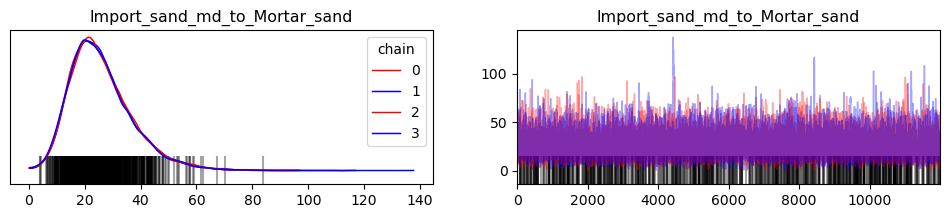

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


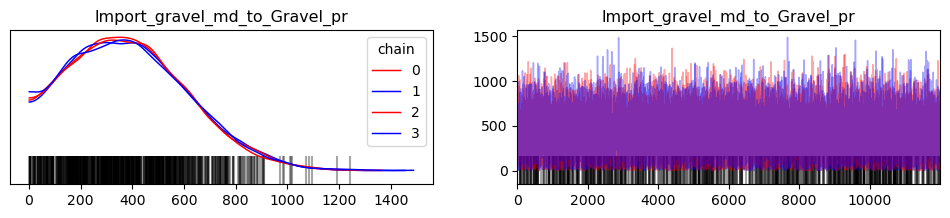

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


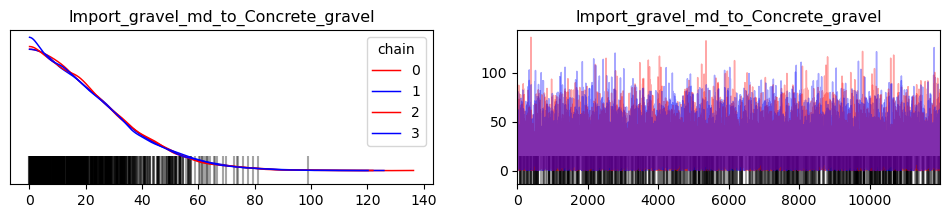

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


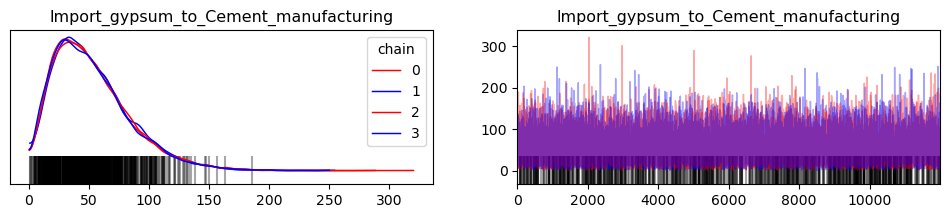

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


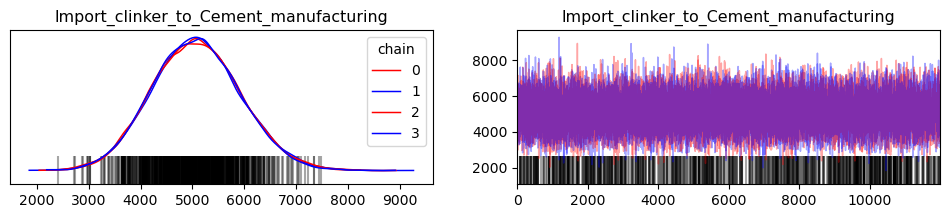

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


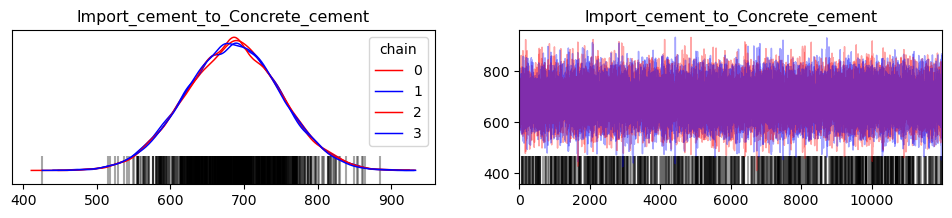

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


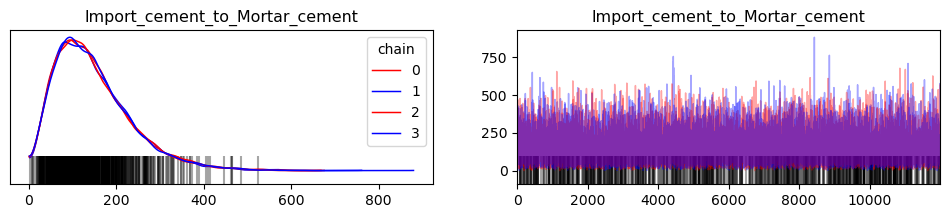

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


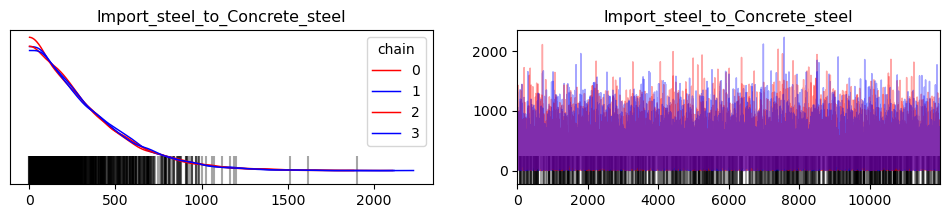

C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


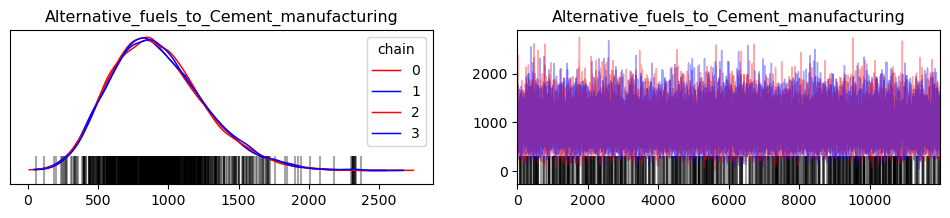

In [5]:
#generate traceplots for the flow variables

az.rcParams["plot.max_subplots"] = 400 #this increases the maximum plots displayed, default is 40.
#There are around 200 posterior flow plots so without this you only plot the first 40. 

plt.tight_layout()


for i in range(0, len(availablechildflows)):
    relevantrow=np.where(allflownumbersmatrix[:, 0] == str(availablechildflows[i]))
    relevantrow=relevantrow[0][0]
    flownumberfrom=allflownumbersmatrix[relevantrow, 1]
    flownumberto=allflownumbersmatrix[relevantrow, 2]
    
    labeller = azl.MapLabeller(var_name_map={"flows": processnamesdict[str(flownumberfrom)]+"_to_"+processnamesdict[str(flownumberto)]})
    posteriorflowtraceplots=az.plot_trace(trace, var_names="flows",compact=True,show=True,backend="matplotlib", coords={'flows_dim_0': [i]},labeller=labeller,legend=True,chain_prop={"color": ['r', 'b']})

    #posteriorflowtraceplots[0,0].get_figure().savefig("outputgraphstrace"+filelabeler(useratiodata)+"/"+"Flowtrace"+processnamesdict[str(flownumberfrom)]+"_to_"+processnamesdict[str(flownumberto)]+filelabeler(useratiodata)+".pdf")

In [6]:
#posterior predictive samples

posterior_predpmy4=pm.sample_posterior_predictive(trace=trace, model=model, random_seed=123456)

Sampling: [CoM, flowdata, ratiodata, stockdata]


In [7]:
trace.to_netcdf("England2019_24_3"+filelabeler(useratiodata)+".nc")
#I had to add 1 after model to get it to save - cannot overwrite existing file and I am unable to delete...
#input this in the mean CoM imballance cell at the end

'England2019_24_3scenarioB.nc'

In [8]:
#before pymc4, pm.sample_posterior_predictive would output a dictionary of 
#stockdata, flowdata, CoM and each key contains as 'value' an array of NxP where N is the sample size 
#and P is the number of variables in that key

#After pymc4, it will output xarray dataset with the above 'keys' (such as stockdata), but the values are like
#(chain, draw, stockdata_dim_2) instead. So I feel like what you need to do is concatenate (vertically stack) two chains to make
#(draw, stockdata_dim_2) again, and put that into a dictionary.

#the below code transforms the posterior_pred back into the pymc3 format so the old ppplots function is compatible with it.

posterior_prededit=posterior_predpmy4['posterior_predictive']

print(posterior_prededit)

print('banana')

stockarray=np.vstack((np.array(posterior_prededit['stockdata'][0]),np.array(posterior_prededit['stockdata'][1])))

flowarray=np.vstack((np.array(posterior_prededit['flowdata'][0]),np.array(posterior_prededit['flowdata'][1])))

if useratiodata==1:
    ratioarray=np.vstack((np.array(posterior_prededit['ratiodata'][0]),np.array(posterior_prededit['ratiodata'][1])))

CoMarray=np.vstack((np.array(posterior_prededit['CoM'][0]),np.array(posterior_prededit['CoM'][1])))

#sanity check shape
print(np.shape(stockarray))
print(np.shape(flowarray))
print(np.shape(CoMarray))

if useratiodata==1:
    posterior_pred = {'stockdata': stockarray, 'flowdata': flowarray, 'ratiodata': ratioarray, 'CoM': CoMarray}
else:
    posterior_pred = {'stockdata': stockarray, 'flowdata': flowarray, 'CoM': CoMarray}


<xarray.Dataset>
Dimensions:          (chain: 4, draw: 12000, stockdata_dim_2: 1,
                      flowdata_dim_2: 11, ratiodata_dim_2: 88, CoM_dim_2: 47)
Coordinates:
  * chain            (chain) int32 0 1 2 3
  * draw             (draw) int32 0 1 2 3 4 5 ... 11995 11996 11997 11998 11999
  * stockdata_dim_2  (stockdata_dim_2) int32 0
  * flowdata_dim_2   (flowdata_dim_2) int32 0 1 2 3 4 5 6 7 8 9 10
  * ratiodata_dim_2  (ratiodata_dim_2) int32 0 1 2 3 4 5 6 ... 82 83 84 85 86 87
  * CoM_dim_2        (CoM_dim_2) int32 0 1 2 3 4 5 6 7 ... 40 41 42 43 44 45 46
Data variables:
    stockdata        (chain, draw, stockdata_dim_2) float64 2.649e+03 ... 2.3...
    flowdata         (chain, draw, flowdata_dim_2) float64 8.008e+03 ... 107.7
    ratiodata        (chain, draw, ratiodata_dim_2) float64 0.5365 ... 0.02492
    CoM              (chain, draw, CoM_dim_2) float64 -343.4 -454.9 ... 114.1
Attributes:
    created_at:                 2025-06-25T08:31:31.332582
    arviz_version:       

In [9]:
import pickle

with open('posteriorpred'+filelabeler(useratiodata)+'.pkl', 'wb') as f:
    pickle.dump(posterior_pred, f)
        
#with open('posteriorpred'+filelabeler(useratiodata)+'.pkl', 'rb') as f:
    #posterior_pred = pickle.load(f)

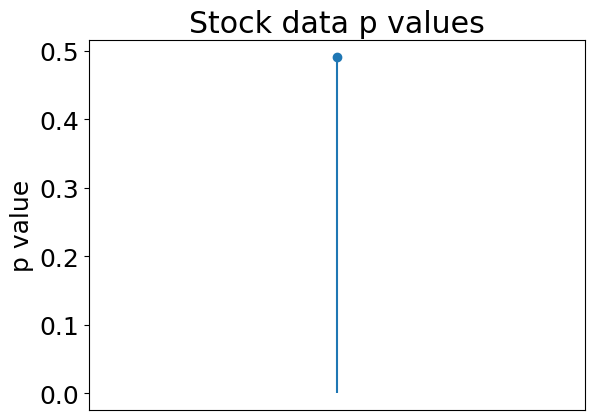

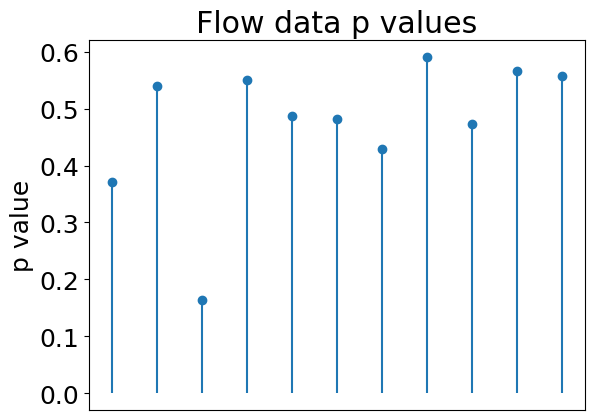

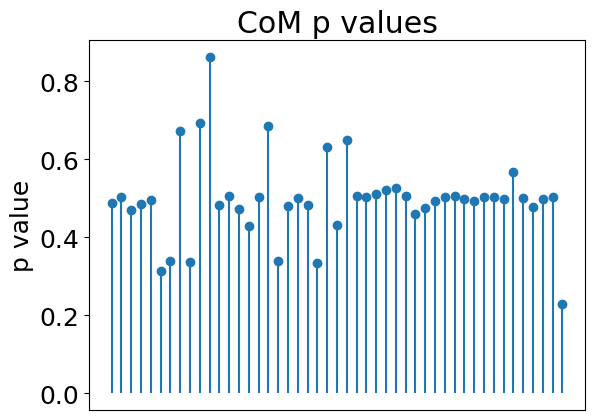

C:\Users\adamr\OneDrive - University College London\BaMFA2\Code\posteriorpredictive.py:60: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  stock_hdi = az.hdi(posterior_pred['stockdata'], hdi_prob=0.95)
C:\Users\adamr\OneDrive - University College London\BaMFA2\Code\posteriorpredictive.py:61: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  flow_hdi = az.hdi(posterior_pred['flowdata'], hdi_prob=0.95)
C:\Users\adamr\OneDrive - University College London\BaMFA2\Code\posteriorpredictive.py:62: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  CoM_hdi = az.hdi(posterior_pred['CoM'], hdi_prob=0.95)


check stock data coverage
[[1.69034897e+03 2.97438136e+03 2.32500000e+03 1.00000000e+00]]
check flow data coverage
[[5.31887852e+03 9.31543070e+03 7.62393600e+03 1.00000000e+00]
 [8.67701319e+03 1.46428102e+04 1.14359040e+04 1.00000000e+00]
 [2.52794793e+04 4.52994231e+04 3.98472000e+04 1.00000000e+00]
 [4.31582735e+02 7.45178879e+02 5.74000000e+02 1.00000000e+00]
 [1.47992286e+03 2.61458148e+03 2.06841600e+03 1.00000000e+00]
 [2.24926546e+03 3.93217430e+03 3.10262400e+03 1.00000000e+00]
 [5.29944681e+03 9.24471968e+03 7.44478000e+03 1.00000000e+00]
 [4.99251376e+02 8.62075329e+02 6.64200000e+02 1.00000000e+00]
 [3.86416381e+02 6.82400337e+02 5.42640000e+02 1.00000000e+00]
 [2.45319973e+02 4.26186277e+02 3.28440000e+02 1.00000000e+00]
 [9.36954300e+01 1.63210281e+02 1.26368400e+02 1.00000000e+00]]
check CoM coverage
[[-8.44028965e+02  8.13913716e+02  0.00000000e+00  1.00000000e+00]
 [-8.13934424e+02  8.24629909e+02  0.00000000e+00  1.00000000e+00]
 [-8.48156345e+02  8.10403489e+02  0.0

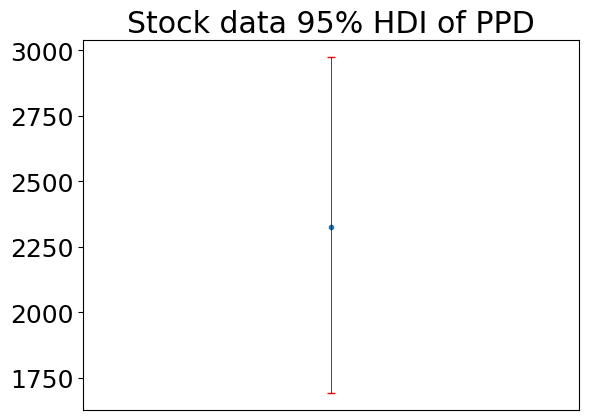

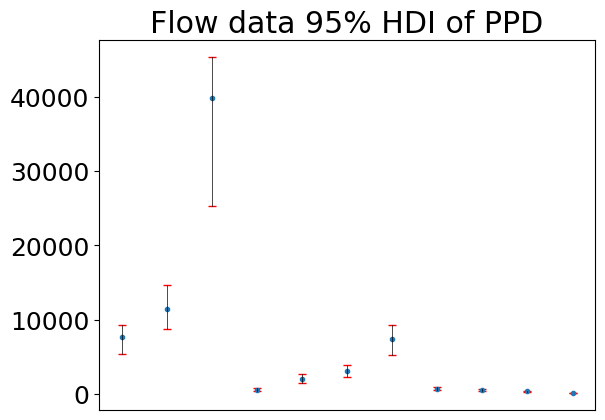

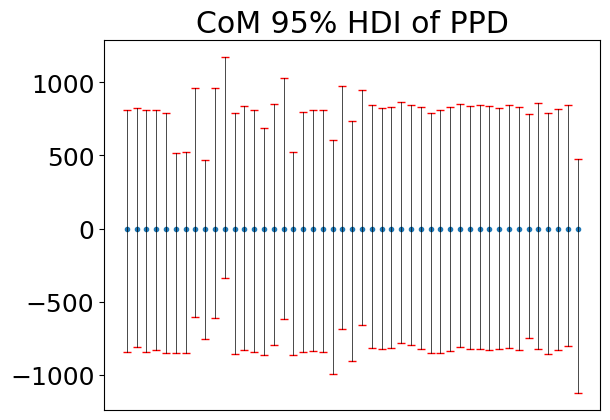

In [10]:
#plot posterior predictive 95% HDI and p values, for flow and change in stock data, and CoM conditions.

import os
directory = "outputgraphsscenarioB"
if not os.path.exists(directory):
    os.makedirs(directory)

ppplots(posterior_pred,datavector,stockindex,flowindex,CoMindex,useratiodata)

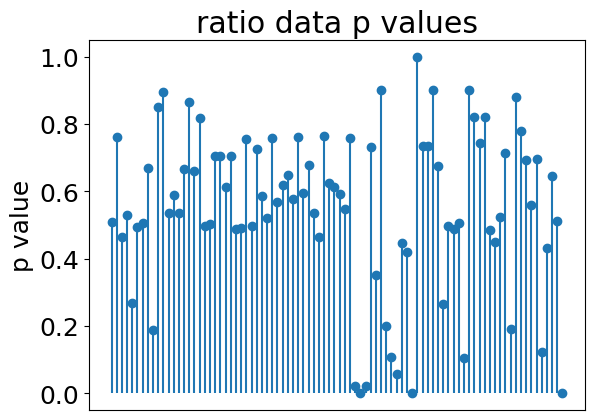

C:\Users\adamr\OneDrive - University College London\BaMFA2\Code\posteriorpredictive.py:166: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  ratio_hdi = az.hdi(posterior_pred['ratiodata'], hdi_prob=0.95)


check ratio data coverage
[[ 2.63444649e-01  1.13169697e+00  7.00000000e-01  1.00000000e+00]
 [-1.42269751e-02  3.19166827e-02  0.00000000e+00  1.00000000e+00]
 [ 5.77341686e-02  5.11443567e-01  3.00000000e-01  1.00000000e+00]
 [ 3.85673863e-01  1.45018527e+00  9.00000000e-01  1.00000000e+00]
 [ 7.12244029e-04  1.54856791e-01  1.00000000e-01  1.00000000e+00]
 [ 2.60245843e-01  1.12534327e+00  7.00000000e-01  1.00000000e+00]
 [ 8.83636189e-02  5.27291139e-01  3.00000000e-01  1.00000000e+00]
 [ 3.63104655e-01  1.23093632e+00  7.00000000e-01  1.00000000e+00]
 [-4.81306025e-03  4.18192528e-01  3.00000000e-01  1.00000000e+00]
 [-9.31484400e-03  3.02472609e-02  0.00000000e+00  1.00000000e+00]
 [-8.02297673e-03  3.66456784e-02  0.00000000e+00  1.00000000e+00]
 [ 2.57656328e-01  9.75442795e-01  6.00000000e-01  1.00000000e+00]
 [-1.71501896e-02  2.23650622e-02  0.00000000e+00  1.00000000e+00]
 [ 8.15518154e-02  3.26885517e-01  2.00000000e-01  1.00000000e+00]
 [-1.53796154e-02  2.52519041e-02  0

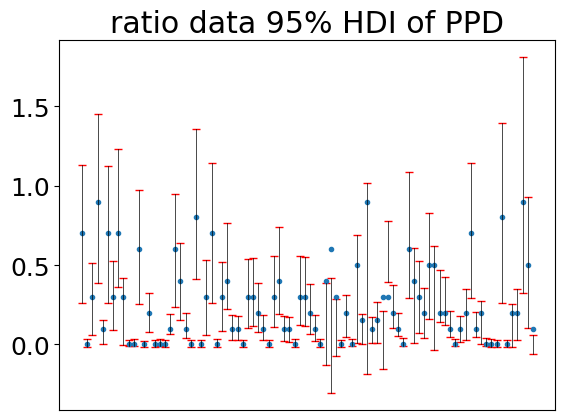

In [11]:
#plot posterior predictive 95% HDI and p values, for ratio data, scenario B only.

ppplotsratiodata(posterior_pred,ratiovector,useratiodata)

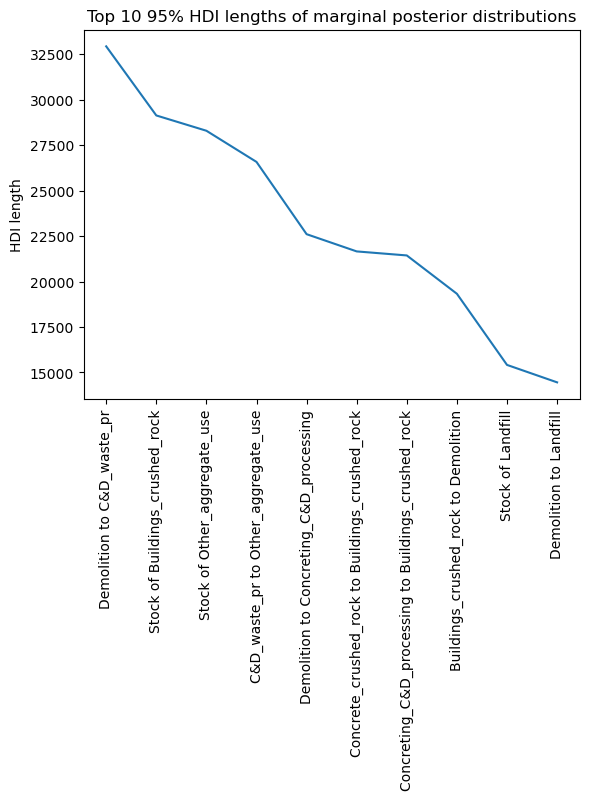

In [12]:
#plot top 10 widths of marginal posterior 95% HDI

ci_95_length=top10hdi(trace,processnamesdict,availablechildstocksandflows,useratiodata,m)

In [13]:
#output information that shows stocks, flows, datavars and the mapping details

#define flow nav
output=az.summary(trace).round(9)
output_flownav = pd.DataFrame(columns=['flownumberfrom', 'flownumberto'])  # Define the columns explicitly
for i in range(0, len(availablechildflows)):
    relevantrow = np.where(allflownumbersmatrix[:, 0] == str(availablechildflows[i]))
    relevantrow = relevantrow[0][0]
    flownumberfrom = allflownumbersmatrix[relevantrow, 1]
    flownumberto = allflownumbersmatrix[relevantrow, 2]
 
    # Add the values to the DataFrame using loc
    output_flownav.loc[len(output_flownav)] = [flownumberfrom, flownumberto]

# Create a DataFrame with two zero-filled columns
output_stocknav = pd.DataFrame({'flownumberfrom': [0] * len(availablechildstocks),
                   'flownumberto': [0] * len(availablechildstocks)})
 
# Create a DataFrame with two zero-filled columns
output_parentnav = pd.DataFrame({'parentflownumberfrom': [0] * len(availablechildstocks+availablechildflows),
                   'parentflownumberto': [0] * len(availablechildstocks+availablechildflows)})
 
output_fsnav = pd.concat([output_stocknav, output_flownav], ignore_index=True)
output_nav = pd.concat([output_parentnav, output_fsnav], axis=1)
output_nav['navigation'] = output_nav['flownumberfrom'].astype(str) + '-' + output_nav['flownumberto'].astype(str)+ '-' + output_nav['parentflownumberfrom'].astype(str) + '-' + output_nav['parentflownumberto'].astype(str)
 
output['flownumberfrom'] = np.nan
output['flownumberto'] = np.nan
output['parentflownumberfrom'] = np.nan
output['parentflownumberto'] = np.nan
output['navigation'] = np.nan
 
output['flownumberfrom'].iloc[:len(output_nav)] = output_nav['flownumberfrom'].astype(str).values
output['flownumberto'].iloc[:len(output_nav)] = output_nav['flownumberto'].astype(str).values
output['parentflownumberfrom'].iloc[:len(output_nav)] = output_nav['parentflownumberfrom'].astype(str).values
output['parentflownumberto'].iloc[:len(output_nav)] = output_nav['parentflownumberto'].astype(str).values
output['navigation'].iloc[:len(output_nav)] = output_nav['navigation'].astype(str).values
 
original_columns = output.columns.tolist()
columns_to_move = ['flownumberfrom', 'flownumberto', 'parentflownumberfrom', 'parentflownumberto', 'navigation']
original_columns = [col for col in original_columns if col not in columns_to_move]
# Define the new column order
new_column_order = columns_to_move + original_columns
# Reorder the columns in the DataFrame
output = output[new_column_order]

C:\Users\adamr\AppData\Local\Temp\ipykernel_10360\1604985028.py:33: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0'
 '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0'
 '0' '0' '0' '0' '0' '1' '1' '2' '2' '2' '3' '3' '3' '4' '4' '4' '5' '5'
 '5' '6' '6' '6' '7' '7' '8' '9' '10' '11' '11' '12' '13' '13' '13' '13'
 '13' '13' '14' '14' '14' '14' '14' '15' '15' '15' '15' '15' '16' '16'
 '16' '16' '16' '17' '17' '17' '17' '17' '17' '17' '17' '17' '17' '18'
 '18' '19' '20' '20' '20' '20' '21' '21' '21' '21' '22' '22' '22' '22'
 '23' '23' '24' '24' '25' '25' '25' '26' '27' '27' '27' '27' '28' '28'
 '29' '29' '30' '30' '31' '31' '32' '32' '33' '33' '34' '34' '35' '35'
 '36' '36' '37' '37' '44' '44' '44' '45' '45' '47' '47' '47' '48' '49'
 '50' '51' '51' '52' '53' '53' '54' '54' '54' '55' '55' '56' '58' '59'
 '59' '60' '61']' has dty

In [14]:
#Output the data to [file name].csv
output.to_csv('England2019_24_3.csv', index=False)

In [15]:
#Here I am checking the length of CoMindex -- the values involved in datavars (called in the next cell). 
#The no. of child processes is 49
#The no. of datavars is 59 (see earlier output)
#40 CoM values -- some are not CoM enforced, e.g., landfilis 'one sided'

print(f"Total rows in datastocks: {len(datastocks)}")
print(f"Total rows in dataflows: {len(dataflows)}")
print(f"Length of CoMindex: {len(CoMindex)}")
print(f"CoMindex: {CoMindex}")

Total rows in datastocks: 73
Total rows in dataflows: 683
Length of CoMindex: 47
CoMindex: [12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]


check CoM posterior means, scenario A
<xarray.DataArray 'datavars' (datavars_dim_0: 47)>
array([-1.70329708e+01,  1.76179746e+00, -3.70088140e+01, -1.54165164e+01,
       -7.84690792e+00, -1.71370260e+02, -1.53316292e+02,  1.73084538e+02,
       -1.27329711e+02,  2.04521097e+02,  4.17831209e+02, -1.90534463e+01,
        2.56700024e+00, -2.90496552e+01, -7.86764075e+01,  2.69878924e+00,
        2.02590821e+02, -1.43356786e+02, -3.18496382e+01,  2.77787804e+00,
       -1.42598301e+01, -1.73295381e+02,  1.36953602e+02, -7.74265944e+01,
        1.59203366e+02,  1.70763942e-01,  5.92170120e+00,  7.32997097e+00,
        2.28086124e+01,  2.74033848e+01,  1.01350267e+01, -3.97922372e+01,
       -2.75376639e+01, -5.54279513e+00,  6.58447041e+00,  9.20346052e+00,
       -1.31261009e+00, -6.76845276e-01,  4.46623398e+00,  6.21664560e-01,
        8.95388904e-01,  6.68617973e+01, -1.36990001e+00, -2.16728285e+01,
        8.91670648e-01,  2.16242470e+00, -3.06076365e+02])
Coordinates:
  * datavars_d

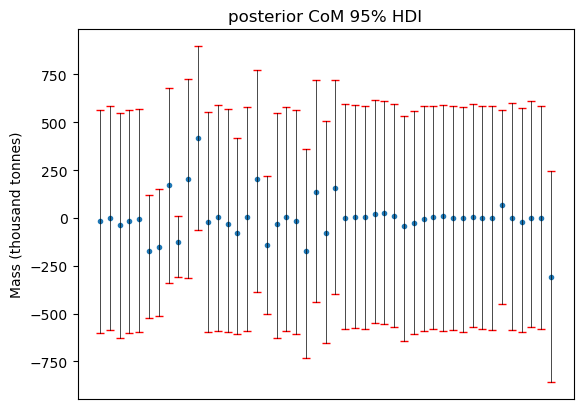

In [16]:
#code for plotting posterior mass conservation conditions:

traceA = az.from_netcdf("England2019_24_3scenarioB.nc") #the nc file saved earlier

traceAdatasample = traceA['posterior'].datavars

traceAdatamean=np.mean(traceAdatasample,axis=(0,1))

traceAdatasamplesoutput = np.vstack((traceAdatasample[0, :, :], traceAdatasample[1, :, :]))
traceAdatasamplestest = np.mean(traceAdatasamplesoutput, axis=0)

print('check CoM posterior means, scenario A')
print(traceAdatamean[CoMindex])

#earlier set-up in origial codebase
traceAhdi=az.hdi(traceA['posterior'], hdi_prob=0.95)
traceAhdistocks=traceAhdi['stocks']
traceAhdiflows=traceAhdi['flows']
traceAhdidatavars=traceAhdi['datavars']

plt.plot(traceAhdidatavars[CoMindex, 0], linestyle='None', marker='_', color='red')
plt.plot(traceAhdidatavars[CoMindex, 1], linestyle='None', marker='_', color='red')
plt.plot(traceAdatamean[CoMindex], linestyle='None', marker='.')
plt.plot((range(0, traceAhdidatavars[CoMindex, 0].size), range(0, traceAhdidatavars[CoMindex, 1].size)), (traceAhdidatavars[CoMindex, 0], traceAhdidatavars[CoMindex, 1]),color='black', linewidth=0.5)
plt.ylabel('Mass (thousand tonnes)')
plt.title('posterior CoM 95% HDI')
plt.xticks([])
#plt.savefig('outputgraphs' + filelabeler(useratiodata) + '/' + 'posteriorCoMhdi' + filelabeler(useratiodata) + '.pdf',bbox_inches="tight")
plt.savefig('outputgraphs' + 'scenarioB' + '/' + 'posteriorCoMhdi' + 'scenarioB' + '.png',bbox_inches="tight")
plt.show()

In [17]:
abs_mean_imbalance = np.mean(np.abs(traceAdatamean[CoMindex]))
print(f"mean of the absolute mass imbalances in the posterior: {abs_mean_imbalance}")

mean of the absolute mass imbalances in the posterior: <xarray.DataArray 'datavars' ()>
array(63.18547077)


C:\Users\adamr\anaconda3\envs\BaMFA_Eng19_aggs\Lib\site-packages\arviz\plots\backends\matplotlib\__init__.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = subplots(rows, cols, **backend_kwargs)


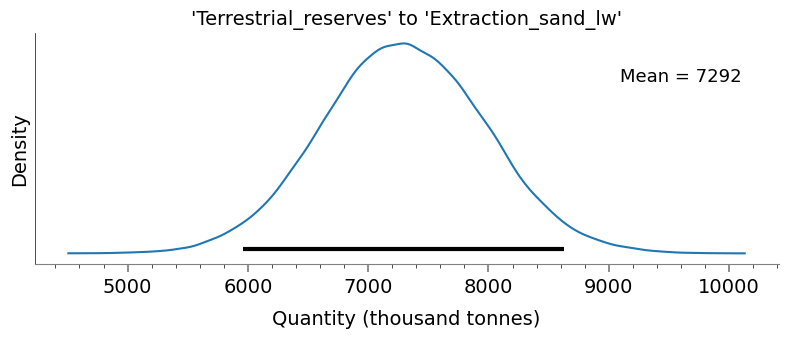

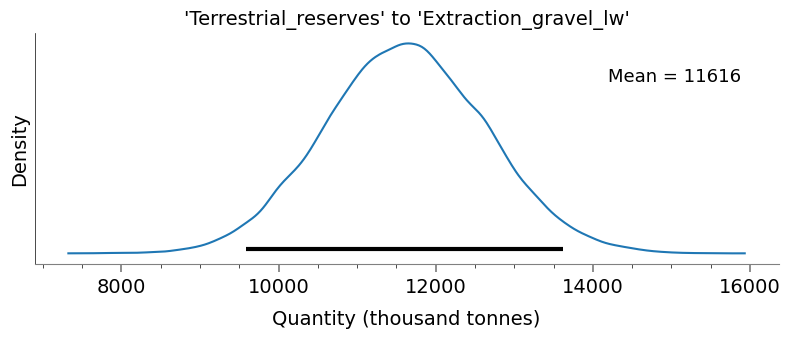

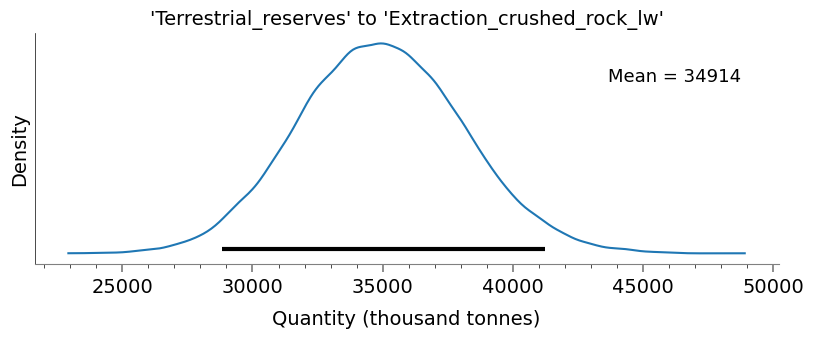

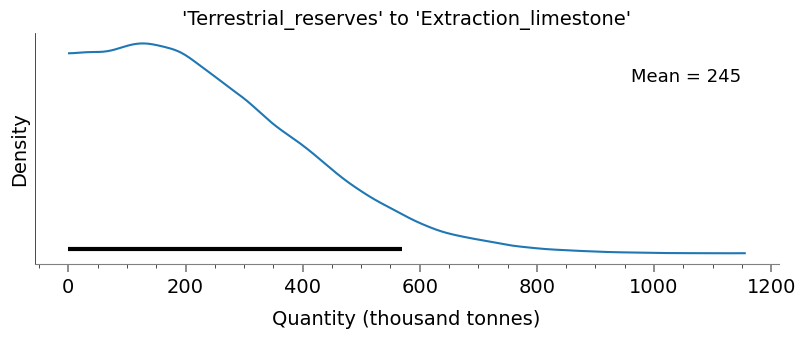

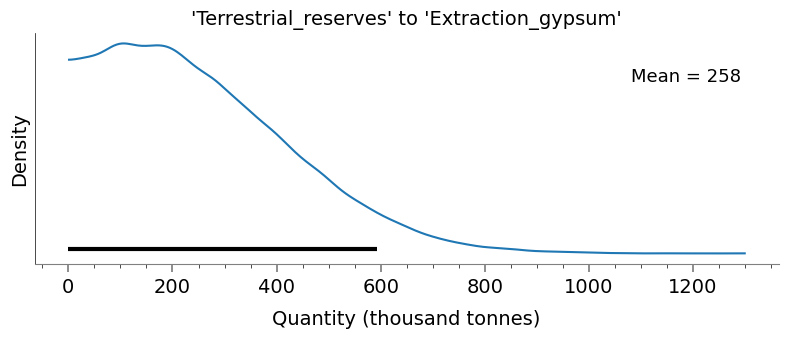

...

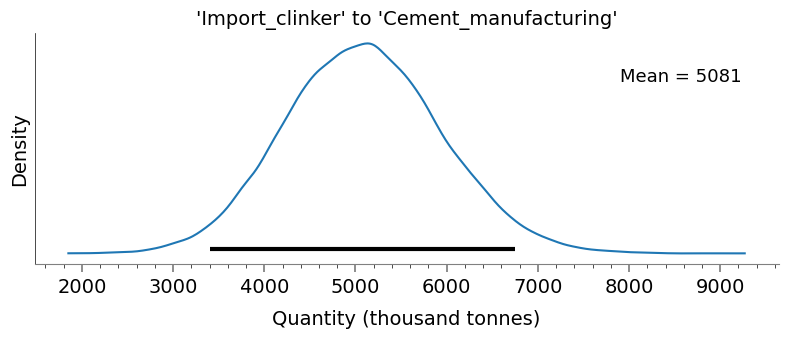

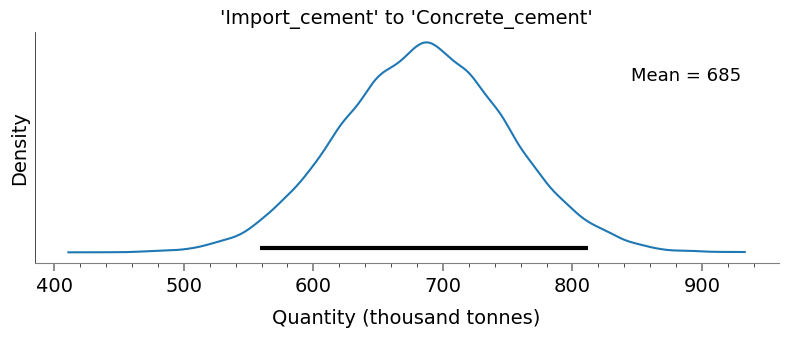

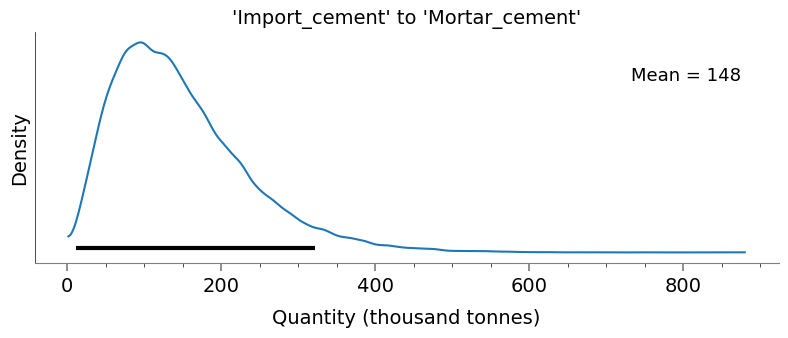

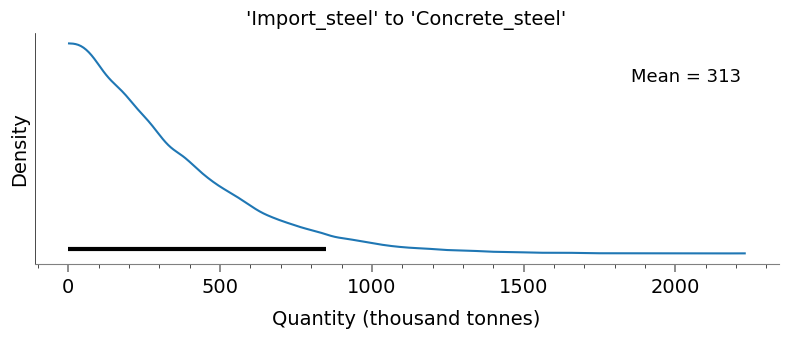

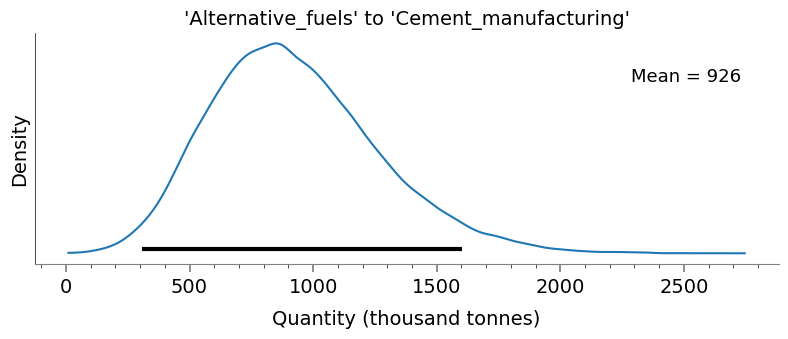

In [18]:
import numpy as np
import arviz as az
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker  # Import correct ticker module

az.rcParams["plot.max_subplots"] = 400  # Increase max displayed plots

for i in range(len(availablechildflows)):
    relevantrow = np.where(allflownumbersmatrix[:, 0] == str(availablechildflows[i]))[0][0]
    flownumberfrom = allflownumbersmatrix[relevantrow, 1]
    flownumberto = allflownumbersmatrix[relevantrow, 2]

    # Generate posterior plot (disabling mean value but keeping HDI bar)
    posteriorflowplots = az.plot_posterior(
        trace, var_names="flows", show=False, backend="matplotlib",
        round_to=3, hdi_prob=0.95, coords={'flows_dim_0': [i]},
        textsize=14, figsize=[9.6, 3], point_estimate=None  #length,height
    )

    ax = posteriorflowplots  # Alias for clarity

    # **Remove HDI value annotations while keeping the HDI bar**
    for text in ax.texts:
        text.set_visible(False)  # Hide all automatically added text

    # Extract and round mean value (no decimals)
    mean_value = round(np.mean(trace.posterior["flows"].sel(flows_dim_0=i).values))

    # Determine x and y limits
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    # Position text dynamically to avoid overlap
    xpos = xlim[1] - (xlim[1] - xlim[0]) * 0.05  # 5% from right edge
    ypos = ylim[0] + (ylim[1] - ylim[0]) * 0.85  # Near top

    ax.text(xpos, ypos, f"Mean = {mean_value}", color="black",
            ha='right', va='top', fontsize=13) #bbox=dict(facecolor='white', alpha=0.7))

    # **Automatically Adjust Major & Minor Ticks for a Natural Axis**
    ax.xaxis.set_major_locator(ticker.AutoLocator())  # Automatic major ticks
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())  # Automatic minor ticks

    # Improve tick visibility
    ax.tick_params(axis='x', which='major', direction='out', length=6, width=1.25)
    ax.tick_params(axis='x', which='minor', direction='out', length=3, width=0.5)

    #adding in a yaxis
    ax.spines['left'].set_visible(True)   # Make left spine visible for y-axis
    ax.spines['left'].set_linewidth(0.5)    # Set line thickness to 1 for consistency

    # **Add labels for x and y axes**
    ax.set_xlabel('Quantity (thousand tonnes)', fontsize=14, labelpad=10)
    ax.set_ylabel('Density', fontsize=14)

    # Set title
    ax.set_title(f"'{processnamesdict[str(flownumberfrom)]}' to '{processnamesdict[str(flownumberto)]}'", fontsize=14)

    # Save figure
    fig = ax.get_figure()
    fig.savefig(f"outputgraphs{filelabeler(useratiodata)}/{processnamesdict[str(flownumberfrom)]}_to_{processnamesdict[str(flownumberto)]}{filelabeler(useratiodata)}.png", bbox_inches='tight', dpi=300)


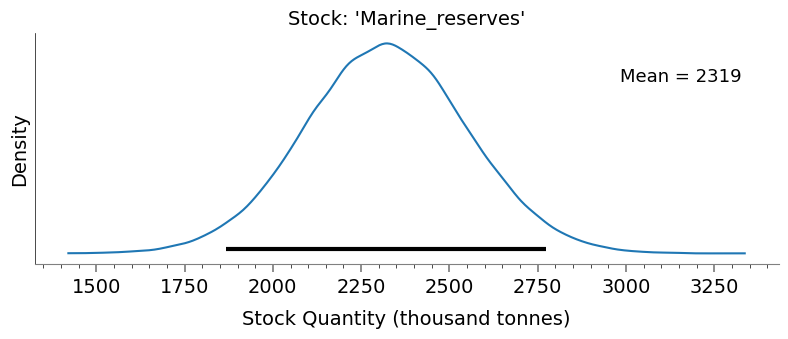

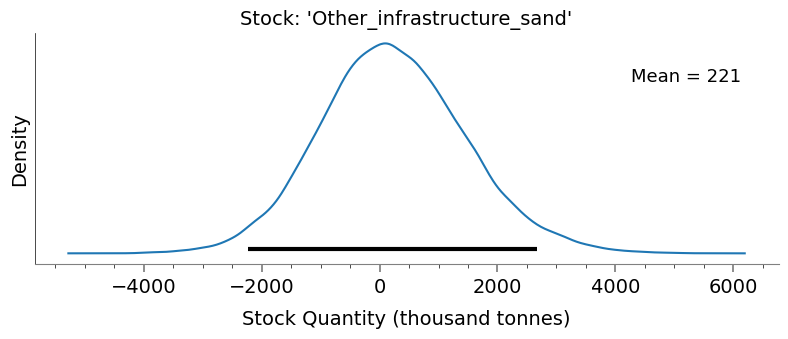

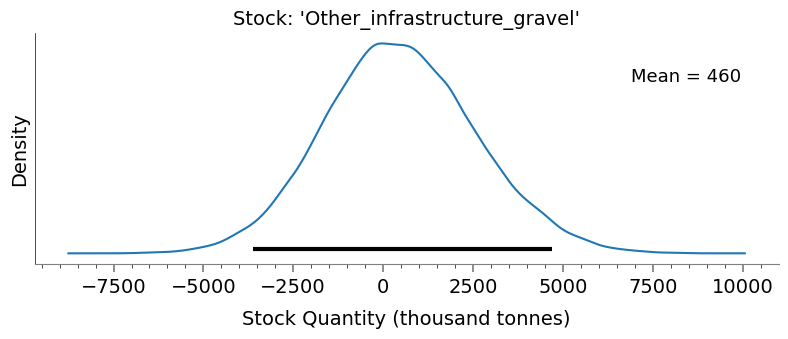

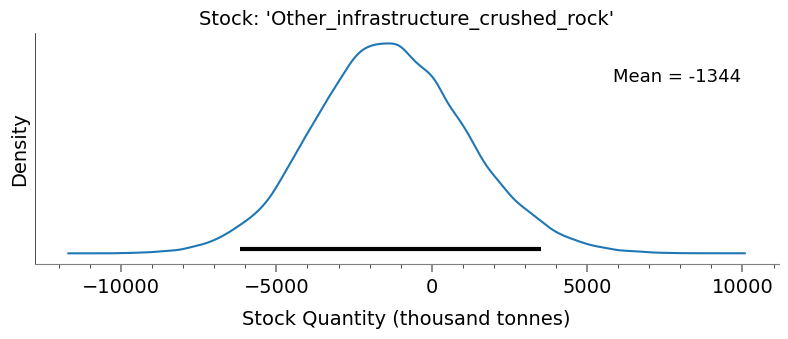

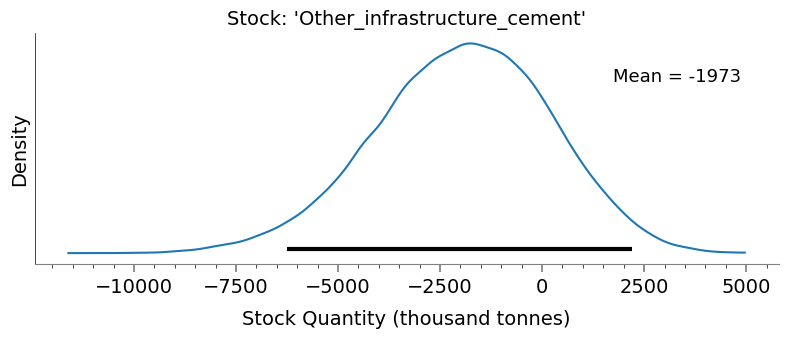

...

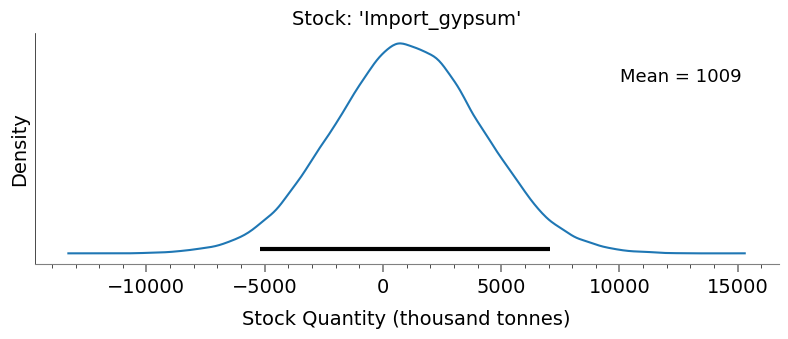

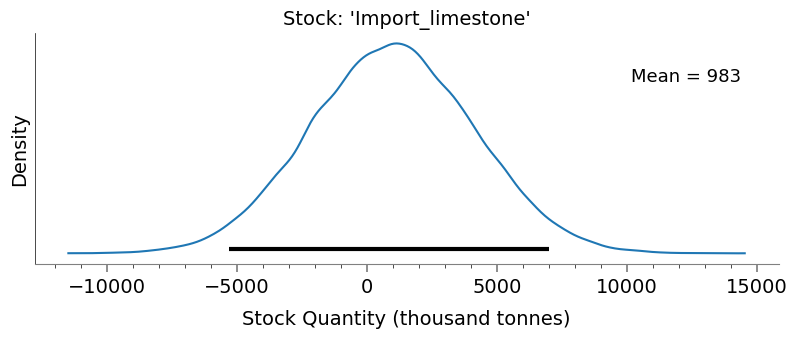

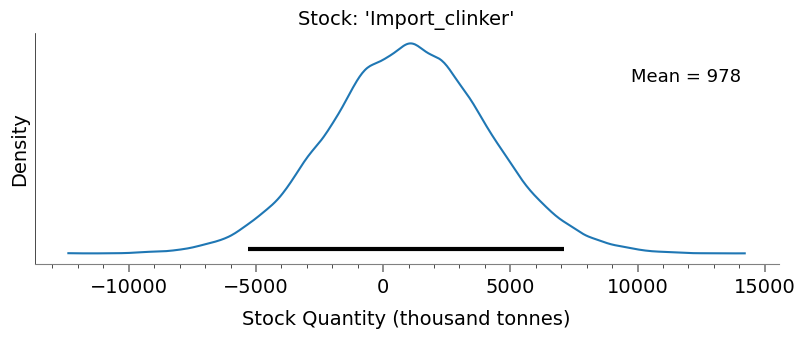

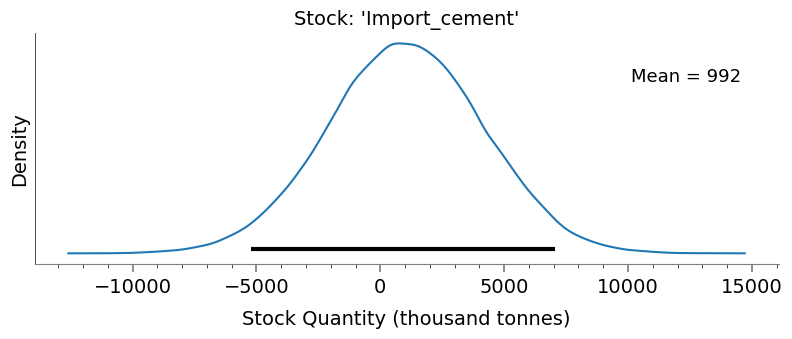

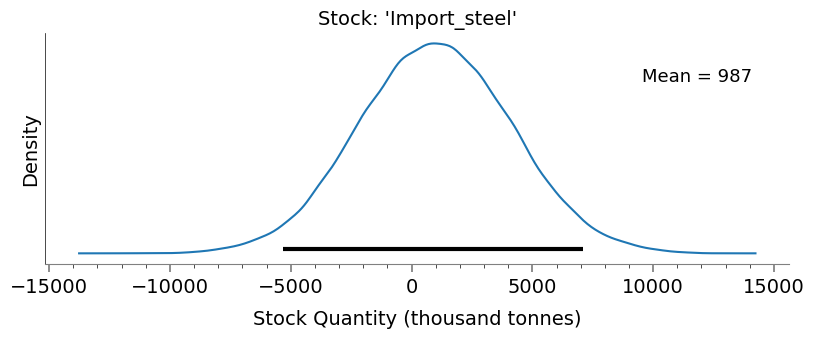

In [19]:
import numpy as np
import arviz as az
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker  

az.rcParams["plot.max_subplots"] = 400  # Increase max displayed plots

for i in range(len(availablechildstocks)):
    stockname = processnamesdict[str(availablechildstocks[i])]  # Get process name
    
    # Generate posterior plot (disabling mean value but keeping HDI bar)
    posteriorstockplots = az.plot_posterior(
        trace, var_names="stocks", show=False, backend="matplotlib",
        round_to=3, hdi_prob=0.95, coords={'stocks_dim_0': [i]},
        textsize=14, figsize=[9.6, 3], point_estimate=None
    )

    ax = posteriorstockplots  # Alias for clarity

    # **Remove HDI value annotations while keeping the HDI bar**
    for text in ax.texts:
        text.set_visible(False)  # Hide all automatically added text

    # Extract and round mean value (no decimals)
    mean_value = round(np.mean(trace.posterior["stocks"].sel(stocks_dim_0=i).values))

    # Determine x and y limits
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    # Position text dynamically to avoid overlap
    xpos = xlim[1] - (xlim[1] - xlim[0]) * 0.05  # 5% from right edge
    ypos = ylim[0] + (ylim[1] - ylim[0]) * 0.85  # Near top

    ax.text(xpos, ypos, f"Mean = {mean_value}", color="black",
            ha='right', va='top', fontsize=13)

    # **Automatically Adjust Major & Minor Ticks for a Natural Axis**
    ax.xaxis.set_major_locator(ticker.AutoLocator())  # Automatic major ticks
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())  # Automatic minor ticks

    # Improve tick visibility
    ax.tick_params(axis='x', which='major', direction='out', length=6, width=1.25)
    ax.tick_params(axis='x', which='minor', direction='out', length=3, width=0.5)

    # Adding in a y-axis
    ax.spines['left'].set_visible(True)  
    ax.spines['left'].set_linewidth(0.5)  

    # **Add labels for x and y axes**
    ax.set_xlabel('Stock Quantity (thousand tonnes)', fontsize=14, labelpad=10)
    ax.set_ylabel('Density', fontsize=14)

    # Set title
    ax.set_title(f"Stock: '{stockname}'", fontsize=14)

    # Save figure
    fig = ax.get_figure()
    fig.savefig(f"outputgraphs{filelabeler(useratiodata)}/Stock_{stockname}{filelabeler(useratiodata)}.png", bbox_inches='tight', dpi=300)